In [1]:
import tensorflow as tf

import networkx as nx
from networkx.drawing.nx_pydot import write_dot
import matplotlib.pyplot as plt
from IPython.display import SVG
from sklearn.tree import export_graphviz
tf.debugging.set_log_device_placement(True)

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

from tensorflow.keras import layers
from sklearn import datasets
import pandas as pd
import numpy as np
print(tf.__version__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))



2.0.0
Num GPUs Available:  2


In [3]:

import matplotlib.pyplot as plt # For making plots

import seaborn as sns # Makes beautiful plots
from sklearn.preprocessing import StandardScaler # Testing sklearn
import tensorflow # Imports tensorflow
import keras # Imports keras

Using TensorFlow backend.


In [4]:
from tensorflow.python.platform import build_info as tf_build_info
print(tf_build_info.cuda_version_number)
# 9.0 in v1.10.0
print(tf_build_info.cudnn_version_number)
# 7 in v1.10.0

10.0
7.6


In [5]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 16504539400365259483, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 3015737134205801540
 physical_device_desc: "device: 0, name: GeForce RTX 2070, pci bus id: 0000:17:00.0, compute capability: 7.5", name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 8469217617175544726
 physical_device_desc: "device: 1, name: GeForce RTX 2070, pci bus id: 0000:65:00.0, compute capability: 7.5"]

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
import datetime, os

In [8]:
from tensorflow.keras.callbacks import TensorBoard

log_dir = 'logs'
tb = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
from keras.layers import Dense, Activation,Conv2D,MaxPooling2D,Flatten,Dropout

## Case Study 12

In [11]:
df = pd.read_csv('HIGGS.csv',header = None)

In [12]:
# Verify size is as expected
print("{:>25}{:>10,} x {:,}\n".format("Shape of raw data is ", df.shape[0], df.shape[1]))

    Shape of raw data is 11,000,000 x 29



In [13]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,1.0,0.869293,-0.635082,0.225690,0.327470,-0.689993,0.754202,-0.248573,-1.092064,0.000000,...,-0.010455,-0.045767,3.101961,1.353760,0.979563,0.978076,0.920005,0.721657,0.988751,0.876678
1,1.0,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
2,1.0,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
3,0.0,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
4,1.0,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487


In [14]:
df[0].describe()

count    1.100000e+07
mean     5.299203e-01
std      4.991040e-01
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: 0, dtype: float64

In [15]:
x1 = df.drop([0], axis = 1)

In [16]:
x1.head()

,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
0,0.869293,-0.635082,0.225690,0.327470,-0.689993,0.754202,-0.248573,-1.092064,0.000000,1.374992,...,-0.010455,-0.045767,3.101961,1.353760,0.979563,0.978076,0.920005,0.721657,0.988751,0.876678
1,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,0.812581,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
2,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,0.851737,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
3,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,2.423265,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
4,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,0.800872,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487


In [17]:
for col in x1.columns: 
    print(col) 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


In [18]:
y = df[0]

In [19]:
y = y.to_numpy()

In [20]:
y[1:20]

array([1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0.,
       0., 1.])

In [21]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_train = scaler.fit_transform(x1)

# Print out the adjustment that the scaler applied to the lepton pT column of data
#print("Note: median values were scaled by multiplying by {:.10f} and adding {:.6f}".format(scaler.scale_[0],scaler.min_[0]))
#multiplied_by = scaler.scale_[0]
#added = scaler.min_[0]

scaled_train_df = pd.DataFrame(scaled_train, columns = x1.columns.values)

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

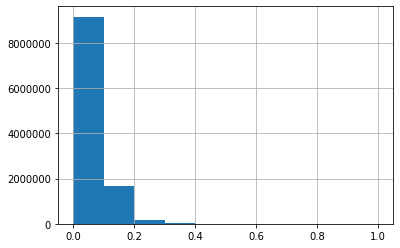

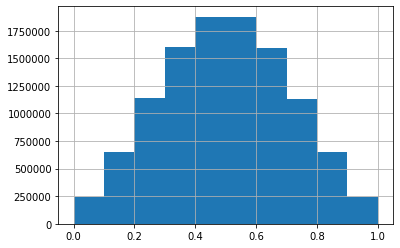

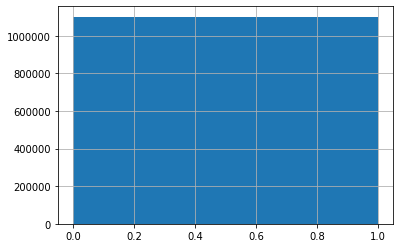

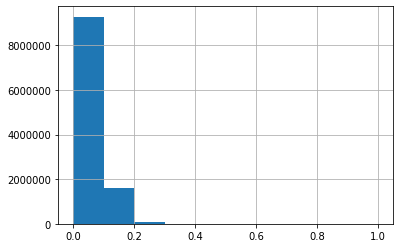

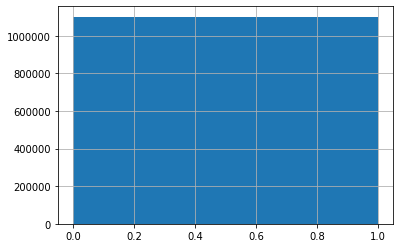

...

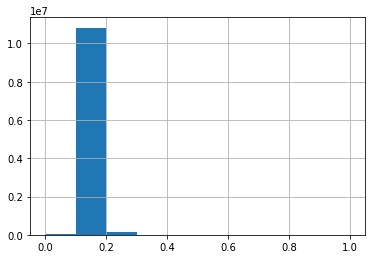

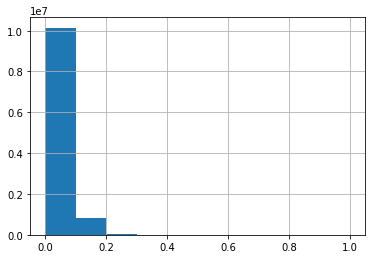

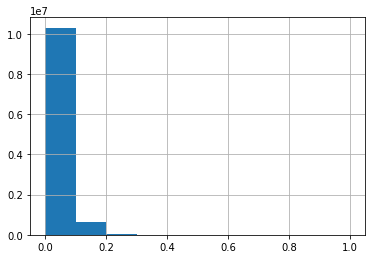

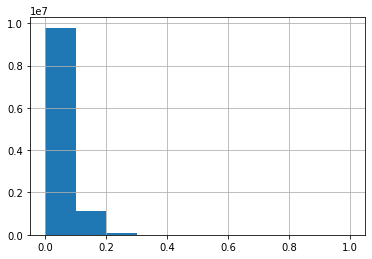

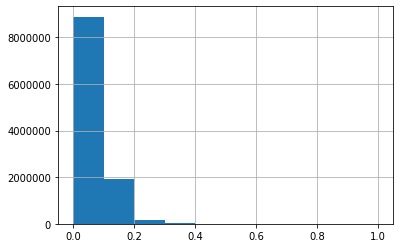

In [23]:
for i in scaled_train_df:
    scaled_train_df[i].hist()
    plt.show()

In [24]:
from keras.applications import Xception
from keras.utils import multi_gpu_model

In [25]:
mirrored_strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"],
                                          cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())

In [26]:

with mirrored_strategy.scope():
    model_higgs = tf.keras.Sequential()
    model_higgs.add(layers.Dense(300, input_dim = 28, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(2, activation = 'sigmoid'))
    
    model_higgs.compile(optimizer=tf.optimizers.SGD(learning_rate = 0.1, decay = 0.00001),
             loss=tf.keras.losses.SparseCategoricalCrossentropy(),
             metrics=['accuracy'])
    
    log_dir = 'higgs_logs'
    tb_higgs = TensorBoard(log_dir=log_dir, histogram_freq=1)

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op LogicalNot in device /job:localho

In [27]:
print(model_higgs.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 300)               8700      
_________________________________________________________________
dense_1 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_2 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_3 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_4 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 602       
Total params: 370,502
Trainable params: 370,502
Non-trainable params: 0
__________________________________________________

In [28]:
x1.shape

(11000000, 28)

In [29]:
with mirrored_strategy.scope():

    x_train, x_test, y_train, y_test = train_test_split(x1, y, test_size=0.20, random_state=102)

In [30]:
with mirrored_strategy.scope():

    history = model_higgs.fit(x_train.values, y_train, validation_data=(x_test.values, y_test), epochs=300, batch_size=50000, callbacks=[tb_higgs])

Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Te

Epoch 12/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6094 - accuracy: 0.6406 - val_loss: 0.6105 - val_accuracy: 0.6346
Epoch 13/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6073 - accuracy: 0.6426 - val_loss: 0.6076 - val_accuracy: 0.6377
Epoch 14/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6052 - accuracy: 0.6450 - val_loss: 0.6063 - val_accuracy: 0.6397
Epoch 15/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6033 - accuracy: 0.6477 - val_loss: 0.6025 - val_accuracy: 0.6447
Epoch 16/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6008 - accuracy: 0.6515 - val_loss: 0.6028 - val_accuracy: 0.6464
Epoch 17/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5996 - accuracy: 0.6547 - val_loss: 0.5949 - val_accuracy: 0.6577
Epoch 18/300
8800000/8800000 [==============================] - 5s 1us/sampl

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5264 - accuracy: 0.7329 - val_loss: 0.5234 - val_accuracy: 0.7349
Epoch 66/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5257 - accuracy: 0.7334 - val_loss: 0.5263 - val_accuracy: 0.7327
Epoch 67/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5248 - accuracy: 0.7340 - val_loss: 0.5236 - val_accuracy: 0.7346
Epoch 68/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5240 - accuracy: 0.7344 - val_loss: 0.5231 - val_accuracy: 0.7348
Epoch 69/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5232 - accuracy: 0.7350 - val_loss: 0.5250 - val_accuracy: 0.7337
Epoch 70/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5227 - accuracy: 0.7352 - val_loss: 0.5209 - val_accuracy: 0.7365
Epoch 71/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5010 - accuracy: 0.7497 - val_loss: 0.5004 - val_accuracy: 0.7498
Epoch 119/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5009 - accuracy: 0.7497 - val_loss: 0.5023 - val_accuracy: 0.7488
Epoch 120/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5004 - accuracy: 0.7502 - val_loss: 0.4998 - val_accuracy: 0.7503
Epoch 121/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5007 - accuracy: 0.7499 - val_loss: 0.5002 - val_accuracy: 0.7499
Epoch 122/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4997 - accuracy: 0.7506 - val_loss: 0.5003 - val_accuracy: 0.7499
Epoch 123/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5004 - accuracy: 0.7501 - val_loss: 0.4996 - val_accuracy: 0.7504
Epoch 124/300
8800000/8800000 [==============================] - 5s 1us/sample - los

Epoch 171/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4908 - accuracy: 0.7563 - val_loss: 0.4920 - val_accuracy: 0.7557
Epoch 172/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4906 - accuracy: 0.7564 - val_loss: 0.4911 - val_accuracy: 0.7561
Epoch 173/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4907 - accuracy: 0.7564 - val_loss: 0.4909 - val_accuracy: 0.7562
Epoch 174/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4905 - accuracy: 0.7565 - val_loss: 0.4915 - val_accuracy: 0.7559
Epoch 175/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4900 - accuracy: 0.7568 - val_loss: 0.4898 - val_accuracy: 0.7569
Epoch 176/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4898 - accuracy: 0.7570 - val_loss: 0.4971 - val_accuracy: 0.7522
Epoch 177/300
8800000/8800000 [==============================] - 5s 1u

Epoch 224/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4845 - accuracy: 0.7604 - val_loss: 0.4849 - val_accuracy: 0.7602
Epoch 225/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4842 - accuracy: 0.7606 - val_loss: 0.4854 - val_accuracy: 0.7600
Epoch 226/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4843 - accuracy: 0.7605 - val_loss: 0.4898 - val_accuracy: 0.7569
Epoch 227/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4842 - accuracy: 0.7605 - val_loss: 0.4854 - val_accuracy: 0.7600
Epoch 228/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4843 - accuracy: 0.7605 - val_loss: 0.4847 - val_accuracy: 0.7604
Epoch 229/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4836 - accuracy: 0.7610 - val_loss: 0.4845 - val_accuracy: 0.7607
Epoch 230/300
8800000/8800000 [==============================] - 5s 1u

Epoch 277/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4799 - accuracy: 0.7634 - val_loss: 0.4833 - val_accuracy: 0.7612
Epoch 278/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4803 - accuracy: 0.7632 - val_loss: 0.4812 - val_accuracy: 0.7627
Epoch 279/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4801 - accuracy: 0.7633 - val_loss: 0.4818 - val_accuracy: 0.7625
Epoch 280/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4800 - accuracy: 0.7634 - val_loss: 0.4830 - val_accuracy: 0.7616
Epoch 281/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4800 - accuracy: 0.7634 - val_loss: 0.4819 - val_accuracy: 0.7623
Epoch 282/300
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.4799 - accuracy: 0.7634 - val_loss: 0.4816 - val_accuracy: 0.7622
Epoch 283/300
8800000/8800000 [==============================] - 5s 1u

In [31]:
with mirrored_strategy.scope():
    predictions = model_higgs.predict(x_test.values)

Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RebatchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AutoShardDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MultiDeviceIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

In [32]:
print("Prediction: {}".format(tf.argmax(predictions, axis=1)))
print("   Actuals: {}".format(y_test))


Executing op ArgMax in device /job:localhost/replica:0/task:0/device:GPU:0
Prediction: [1 1 0 ... 0 1 0]
   Actuals: [0. 1. 0. ... 0. 1. 0.]


In [33]:
test_accuracy = tf.keras.metrics.Accuracy()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0


In [34]:
test_accuracy(tf.argmax(predictions, axis=1), y_test)
print("Test set accuracy: {:.3%}".format(test_accuracy.result()))


Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignAddVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Test set accuracy: 76.090%


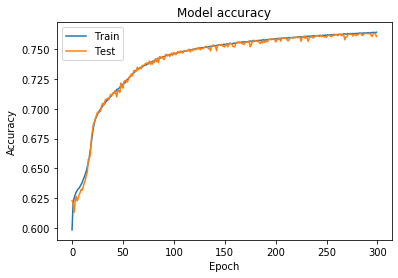

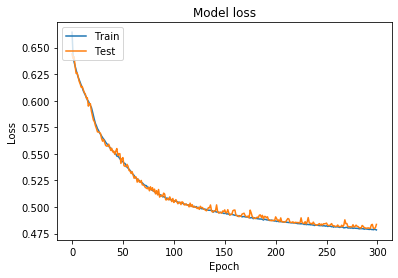

In [35]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

earlystop_callback = EarlyStopping(
  monitor='val_accuracy', min_delta=0.0001,
  patience=1,verbose=1)

within model.fit()  ,callbacks=[earlystop_callback]

In [36]:
#time for some hyperparams

In [124]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

In [38]:
import pandas as pd
df = pd.read_csv("HIGGS.csv",nrows=100000)
df.columns=['label','lepton pT', 'lepton eta', 'lepton phi', 'missing energy magnitude', 'missing energy phi', 'jet 1 pt',
             'jet 1 eta', 'jet 1 phi', 'jet 1 b-tag', 'jet 2 pt', 'jet 2 eta', 'jet 2 phi', 'jet 2 b-tag', 'jet 3 pt',
             'jet 3 eta', 'jet 3 phi', 'jet 3 b-tag', 'jet 4 pt', 'jet 4 eta', 'jet 4 phi', 'jet 4 b-tag', 'm_jj',
             'm_jjj', 'm_lv','m_jlv', 'm_bb', 'm_wbb', 'm_wwbb']
from sklearn.model_selection import train_test_split

In [48]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow import feature_column
from tensorflow.keras import layers
import tensorflow.compat.v2.feature_column as fc
 

 
x_train, x_test, y_train, y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0:1], test_size=0.20, random_state=102)
 
#Estimators are a pain

In [49]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [104]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([100, 200, 300, 500]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))



In [105]:
METRIC_ACCURACY = 'Accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

In [106]:
# The only trick here is the fit expects matrices, not dataframes.
# so just use .values
# also change from 10 classes to 2
# also change loss function
def train_test_model(hparams):
  model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),  
    tf.keras.layers.Dense(1, activation=tf.nn.sigmoid),
  ])
  model.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss='binary_crossentropy',
      metrics=['accuracy'],
  )

  model.fit(x_train.values, y_train.values, epochs=1000, batch_size=1000) # Run with 1 epoch to speed things up for demo purposes
  _, accuracy = model.evaluate(x_test.values, y_test.values)
  return accuracy

In [107]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [108]:
"""
earlystop_callback = EarlyStopping(
  monitor='val_accuracy', min_delta=0.0001,
  patience=1,verbose=1)


history = model.fit(
    ...,
    callbacks=[
        tf.keras.callbacks.TensorBoard(logdir),  # log metrics
        hp.KerasCallback(logdir, hparams),   # log hparams
        earlystop_callback,    #earlystopping
    ],
)

"""

"\nearlystop_callback = EarlyStopping(\n  monitor='val_accuracy', min_delta=0.0001,\n  patience=1,verbose=1)\n\n\nhistory = model.fit(\n    ...,\n    callbacks=[\n        tf.keras.callbacks.TensorBoard(logdir),  # log metrics\n        hp.KerasCallback(logdir, hparams),   # log hparams\n        earlystop_callback,    #earlystopping\n    ],\n)\n\n"

In [109]:
with mirrored_strategy.scope():

    session_num = 0

    for num_units in HP_NUM_UNITS.domain.values:
      for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
        for optimizer in HP_OPTIMIZER.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
          }
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          run('logs/hparam_tuning/' + run_name, hparams)
          session_num += 1

--- Starting trial: run-0
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op Reshape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:loc

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6217 - accuracy: 0.6520
Epoch 5/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6136 - accuracy: 0.6612
Epoch 6/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6067 - accuracy: 0.6678
Epoch 7/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6014 - accuracy: 0.6737
Epoch 8/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5953 - accuracy: 0.6776
Epoch 9/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5905 - accuracy: 0.6825
Epoch 10/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5861 - accuracy: 0.6864
Epoch 11/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5831 - accuracy: 0.6891
Epoch 12/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5786 - accuracy: 0.6924
Epoch 13/1000
80000/80000 [===========

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4640 - accuracy: 0.7766
Epoch 80/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4646 - accuracy: 0.7747
Epoch 81/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4594 - accuracy: 0.7777
Epoch 82/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4615 - accuracy: 0.7775
Epoch 83/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4587 - accuracy: 0.7806
Epoch 84/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4580 - accuracy: 0.7788
Epoch 85/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4565 - accuracy: 0.7787
Epoch 86/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4570 - accuracy: 0.7805
Epoch 87/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4564 - accuracy: 0.7798
Epoch 88/1000
80000/80000 [======

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4125 - accuracy: 0.8066
Epoch 154/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4090 - accuracy: 0.8090
Epoch 155/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4087 - accuracy: 0.8079
Epoch 156/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4114 - accuracy: 0.8095
Epoch 157/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4100 - accuracy: 0.8095
Epoch 158/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4085 - accuracy: 0.8088
Epoch 159/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4065 - accuracy: 0.8111
Epoch 160/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4076 - accuracy: 0.8116
Epoch 161/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4074 - accuracy: 0.8097
Epoch 162/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3836 - accuracy: 0.8242
Epoch 228/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3832 - accuracy: 0.8245
Epoch 229/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3842 - accuracy: 0.8238
Epoch 230/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3825 - accuracy: 0.8253
Epoch 231/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3823 - accuracy: 0.8249
Epoch 232/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3795 - accuracy: 0.8256
Epoch 233/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3838 - accuracy: 0.8245
Epoch 234/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3820 - accuracy: 0.8246
Epoch 235/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3826 - accuracy: 0.8248
Epoch 236/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3687 - accuracy: 0.8338
Epoch 302/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3635 - accuracy: 0.8367
Epoch 303/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3674 - accuracy: 0.8348
Epoch 304/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3628 - accuracy: 0.8375
Epoch 305/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3691 - accuracy: 0.8344
Epoch 306/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3642 - accuracy: 0.8353
Epoch 307/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3654 - accuracy: 0.8350
Epoch 308/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3659 - accuracy: 0.8364
Epoch 309/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3631 - accuracy: 0.8374
Epoch 310/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3552 - accuracy: 0.8406
Epoch 376/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3540 - accuracy: 0.8410
Epoch 377/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3502 - accuracy: 0.8425
Epoch 378/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3550 - accuracy: 0.8405
Epoch 379/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3511 - accuracy: 0.8433
Epoch 380/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3520 - accuracy: 0.8441
Epoch 381/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3533 - accuracy: 0.8421
Epoch 382/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3500 - accuracy: 0.8439
Epoch 383/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3507 - accuracy: 0.8430
Epoch 384/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3443 - accuracy: 0.8493
Epoch 450/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3433 - accuracy: 0.8466
Epoch 451/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3448 - accuracy: 0.8466
Epoch 452/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3429 - accuracy: 0.8490
Epoch 453/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3411 - accuracy: 0.8503
Epoch 454/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3457 - accuracy: 0.8488
Epoch 455/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3404 - accuracy: 0.8495
Epoch 456/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3412 - accuracy: 0.8496
Epoch 457/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3402 - accuracy: 0.8488
Epoch 458/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3306 - accuracy: 0.8545
Epoch 524/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3383 - accuracy: 0.8521
Epoch 525/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3345 - accuracy: 0.8538
Epoch 526/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3347 - accuracy: 0.8541
Epoch 527/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3337 - accuracy: 0.8541
Epoch 528/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3366 - accuracy: 0.8517
Epoch 529/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3330 - accuracy: 0.8543
Epoch 530/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3311 - accuracy: 0.8554
Epoch 531/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3323 - accuracy: 0.8544
Epoch 532/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3270 - accuracy: 0.8593
Epoch 598/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3287 - accuracy: 0.8571
Epoch 599/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3257 - accuracy: 0.8580
Epoch 600/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3290 - accuracy: 0.8567
Epoch 601/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3293 - accuracy: 0.8566
Epoch 602/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3309 - accuracy: 0.8557
Epoch 603/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3280 - accuracy: 0.8565
Epoch 604/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3265 - accuracy: 0.8578
Epoch 605/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3280 - accuracy: 0.8574
Epoch 606/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3229 - accuracy: 0.8592
Epoch 672/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3208 - accuracy: 0.8611
Epoch 673/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3236 - accuracy: 0.8605
Epoch 674/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3214 - accuracy: 0.8607
Epoch 675/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3214 - accuracy: 0.8617
Epoch 676/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3208 - accuracy: 0.8600
Epoch 677/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3196 - accuracy: 0.8616
Epoch 678/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3220 - accuracy: 0.8603
Epoch 679/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3214 - accuracy: 0.8597
Epoch 680/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3158 - accuracy: 0.8632
Epoch 746/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3160 - accuracy: 0.8640
Epoch 747/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3174 - accuracy: 0.8628
Epoch 748/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3176 - accuracy: 0.8627
Epoch 749/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3139 - accuracy: 0.8652
Epoch 750/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3173 - accuracy: 0.8647
Epoch 751/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3175 - accuracy: 0.8616
Epoch 752/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3164 - accuracy: 0.8631
Epoch 753/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3183 - accuracy: 0.8620
Epoch 754/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3083 - accuracy: 0.8680
Epoch 820/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3113 - accuracy: 0.8663
Epoch 821/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3153 - accuracy: 0.8644
Epoch 822/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3129 - accuracy: 0.8667
Epoch 823/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3102 - accuracy: 0.8667
Epoch 824/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3128 - accuracy: 0.8655
Epoch 825/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3129 - accuracy: 0.8646
Epoch 826/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3102 - accuracy: 0.8672
Epoch 827/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3132 - accuracy: 0.8649
Epoch 828/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3067 - accuracy: 0.8702
Epoch 894/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3086 - accuracy: 0.8675
Epoch 895/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3076 - accuracy: 0.8693
Epoch 896/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3120 - accuracy: 0.8664
Epoch 897/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3118 - accuracy: 0.8674
Epoch 898/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3072 - accuracy: 0.8687
Epoch 899/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3094 - accuracy: 0.8676
Epoch 900/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3046 - accuracy: 0.8691
Epoch 901/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3065 - accuracy: 0.8695
Epoch 902/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3054 - accuracy: 0.8702
Epoch 968/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3051 - accuracy: 0.8695
Epoch 969/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3049 - accuracy: 0.8705
Epoch 970/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3051 - accuracy: 0.8714
Epoch 971/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3093 - accuracy: 0.8679
Epoch 972/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3034 - accuracy: 0.8716
Epoch 973/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3037 - accuracy: 0.8711
Epoch 974/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3037 - accuracy: 0.8714
Epoch 975/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3061 - accuracy: 0.8703
Epoch 976/1000
80000/8000

Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
--- Starting trial: run-1
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6579 - accuracy: 0.6054
Epoch 60/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6587 - accuracy: 0.6031
Epoch 61/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6569 - accuracy: 0.6061
Epoch 62/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6564 - accuracy: 0.6069
Epoch 63/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6566 - accuracy: 0.6070
Epoch 64/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6559 - accuracy: 0.6082
Epoch 65/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6556 - accuracy: 0.6084
Epoch 66/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6562 - accuracy: 0.6087
Epoch 67/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6559 - accuracy: 0.6079
Epoch 68/1000
80000/80000 [======

Epoch 134/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6382 - accuracy: 0.6323
Epoch 135/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6375 - accuracy: 0.6327
Epoch 136/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6369 - accuracy: 0.6334
Epoch 137/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6374 - accuracy: 0.6340
Epoch 138/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6368 - accuracy: 0.6334
Epoch 139/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6366 - accuracy: 0.6338
Epoch 140/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6365 - accuracy: 0.6339
Epoch 141/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6365 - accuracy: 0.6349
Epoch 142/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6362 - accuracy: 0.6338
Epoch 143/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6230 - accuracy: 0.6496
Epoch 209/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6220 - accuracy: 0.6503
Epoch 210/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6221 - accuracy: 0.6490
Epoch 211/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6223 - accuracy: 0.6492
Epoch 212/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6225 - accuracy: 0.6488
Epoch 213/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6215 - accuracy: 0.6499
Epoch 214/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6217 - accuracy: 0.6481
Epoch 215/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6212 - accuracy: 0.6496
Epoch 216/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6209 - accuracy: 0.6513
Epoch 217/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6073 - accuracy: 0.6651
Epoch 283/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6066 - accuracy: 0.6647
Epoch 284/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6068 - accuracy: 0.6659
Epoch 285/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6071 - accuracy: 0.6647
Epoch 286/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6067 - accuracy: 0.6651
Epoch 287/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6062 - accuracy: 0.6660
Epoch 288/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6058 - accuracy: 0.6671
Epoch 289/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6058 - accuracy: 0.6665
Epoch 290/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6057 - accuracy: 0.6663
Epoch 291/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5951 - accuracy: 0.6774
Epoch 357/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5965 - accuracy: 0.6748
Epoch 358/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5954 - accuracy: 0.6769
Epoch 359/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5942 - accuracy: 0.6777
Epoch 360/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5953 - accuracy: 0.6778
Epoch 361/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5955 - accuracy: 0.6769
Epoch 362/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5938 - accuracy: 0.6768
Epoch 363/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5951 - accuracy: 0.6779
Epoch 364/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5943 - accuracy: 0.6787
Epoch 365/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5857 - accuracy: 0.6855
Epoch 431/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5848 - accuracy: 0.6870
Epoch 432/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5847 - accuracy: 0.6874
Epoch 433/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5855 - accuracy: 0.6866
Epoch 434/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5841 - accuracy: 0.6878
Epoch 435/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5855 - accuracy: 0.6860
Epoch 436/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5847 - accuracy: 0.6869
Epoch 437/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5840 - accuracy: 0.6876
Epoch 438/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5841 - accuracy: 0.6883
Epoch 439/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5757 - accuracy: 0.6959
Epoch 505/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5745 - accuracy: 0.6973
Epoch 506/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5752 - accuracy: 0.6977
Epoch 507/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5748 - accuracy: 0.6974
Epoch 508/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5753 - accuracy: 0.6958
Epoch 509/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5748 - accuracy: 0.6967
Epoch 510/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5742 - accuracy: 0.6973
Epoch 511/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5745 - accuracy: 0.6965
Epoch 512/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5741 - accuracy: 0.6975
Epoch 513/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5668 - accuracy: 0.7032
Epoch 579/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5676 - accuracy: 0.7028
Epoch 580/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5664 - accuracy: 0.7043
Epoch 581/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5668 - accuracy: 0.7030
Epoch 582/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5668 - accuracy: 0.7035
Epoch 583/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5661 - accuracy: 0.7039
Epoch 584/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5668 - accuracy: 0.7040
Epoch 585/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5663 - accuracy: 0.7034
Epoch 586/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5652 - accuracy: 0.7037
Epoch 587/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5604 - accuracy: 0.7076
Epoch 653/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5609 - accuracy: 0.7076
Epoch 654/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5614 - accuracy: 0.7080
Epoch 655/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5609 - accuracy: 0.7081
Epoch 656/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5607 - accuracy: 0.7081
Epoch 657/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5617 - accuracy: 0.7073
Epoch 658/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5601 - accuracy: 0.7082
Epoch 659/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5606 - accuracy: 0.7085
Epoch 660/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5607 - accuracy: 0.7077
Epoch 661/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5554 - accuracy: 0.7113
Epoch 727/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5555 - accuracy: 0.7124
Epoch 728/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5556 - accuracy: 0.7122
Epoch 729/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5560 - accuracy: 0.7117
Epoch 730/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5555 - accuracy: 0.7127
Epoch 731/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5563 - accuracy: 0.7111
Epoch 732/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5563 - accuracy: 0.7117
Epoch 733/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5556 - accuracy: 0.7123
Epoch 734/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5554 - accuracy: 0.7123
Epoch 735/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5505 - accuracy: 0.7158
Epoch 800/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5511 - accuracy: 0.7145
Epoch 801/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5509 - accuracy: 0.7155
Epoch 802/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5516 - accuracy: 0.7149
Epoch 803/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5513 - accuracy: 0.7149
Epoch 804/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5505 - accuracy: 0.7159
Epoch 805/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5508 - accuracy: 0.7158
Epoch 806/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5519 - accuracy: 0.7150
Epoch 807/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5509 - accuracy: 0.7167
Epoch 808/1000
80000/8000

Epoch 873/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5460 - accuracy: 0.7204
Epoch 874/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5477 - accuracy: 0.7175
Epoch 875/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5469 - accuracy: 0.7184
Epoch 876/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5468 - accuracy: 0.7190
Epoch 877/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5474 - accuracy: 0.7183
Epoch 878/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5479 - accuracy: 0.7193
Epoch 879/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5466 - accuracy: 0.7192
Epoch 880/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5481 - accuracy: 0.7173
Epoch 881/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5474 - accuracy: 0.7176
Epoch 882/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5443 - accuracy: 0.7210
Epoch 948/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5420 - accuracy: 0.7219
Epoch 949/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5432 - accuracy: 0.7223
Epoch 950/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5432 - accuracy: 0.7218
Epoch 951/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5432 - accuracy: 0.7224
Epoch 952/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5437 - accuracy: 0.7208
Epoch 953/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5433 - accuracy: 0.7214
Epoch 954/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5443 - accuracy: 0.7202
Epoch 955/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5431 - accuracy: 0.7225
Epoch 956/1000
80000/8000

--- Starting trial: run-2
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op DestroyResourceOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/r

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5929 - accuracy: 0.6812
Epoch 23/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5926 - accuracy: 0.6809
Epoch 24/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5906 - accuracy: 0.6827
Epoch 25/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5911 - accuracy: 0.6823
Epoch 26/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5894 - accuracy: 0.6831
Epoch 27/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5896 - accuracy: 0.6834
Epoch 28/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5871 - accuracy: 0.6876
Epoch 29/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5866 - accuracy: 0.6846
Epoch 30/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5843 - accuracy: 0.6889
Epoch 31/1000
80000/80000 [======

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5597 - accuracy: 0.7091
Epoch 98/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5589 - accuracy: 0.7085
Epoch 99/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5570 - accuracy: 0.7104
Epoch 100/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5577 - accuracy: 0.7106
Epoch 101/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5561 - accuracy: 0.7104
Epoch 102/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5561 - accuracy: 0.7098
Epoch 103/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5562 - accuracy: 0.7115
Epoch 104/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5561 - accuracy: 0.7106
Epoch 105/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5552 - accuracy: 0.7115
Epoch 106/1000
80000/80000 

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5451 - accuracy: 0.7182
Epoch 172/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5446 - accuracy: 0.7193
Epoch 173/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5454 - accuracy: 0.7189
Epoch 174/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5442 - accuracy: 0.7179
Epoch 175/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5452 - accuracy: 0.7208
Epoch 176/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5450 - accuracy: 0.7179
Epoch 177/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5455 - accuracy: 0.7187
Epoch 178/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5439 - accuracy: 0.7178
Epoch 179/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5451 - accuracy: 0.7181
Epoch 180/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5381 - accuracy: 0.7236
Epoch 246/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5376 - accuracy: 0.7238
Epoch 247/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5374 - accuracy: 0.7235
Epoch 248/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5376 - accuracy: 0.7250
Epoch 249/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5375 - accuracy: 0.7225
Epoch 250/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5369 - accuracy: 0.7256
Epoch 251/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5357 - accuracy: 0.7260
Epoch 252/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5355 - accuracy: 0.7240
Epoch 253/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5379 - accuracy: 0.7250
Epoch 254/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5323 - accuracy: 0.7279
Epoch 320/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5338 - accuracy: 0.7250
Epoch 321/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5314 - accuracy: 0.7280
Epoch 322/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5333 - accuracy: 0.7267
Epoch 323/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5309 - accuracy: 0.7302
Epoch 324/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5324 - accuracy: 0.7281
Epoch 325/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5316 - accuracy: 0.7281
Epoch 326/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5322 - accuracy: 0.7283
Epoch 327/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5316 - accuracy: 0.7287
Epoch 328/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5277 - accuracy: 0.7311
Epoch 394/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5284 - accuracy: 0.7300
Epoch 395/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5266 - accuracy: 0.7314
Epoch 396/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5288 - accuracy: 0.7302
Epoch 397/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5283 - accuracy: 0.7294
Epoch 398/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5287 - accuracy: 0.7306
Epoch 399/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5288 - accuracy: 0.7293
Epoch 400/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5285 - accuracy: 0.7309
Epoch 401/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5273 - accuracy: 0.7313
Epoch 402/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5237 - accuracy: 0.7330
Epoch 468/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5244 - accuracy: 0.7330
Epoch 469/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5250 - accuracy: 0.7319
Epoch 470/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5231 - accuracy: 0.7329
Epoch 471/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5239 - accuracy: 0.7319
Epoch 472/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5217 - accuracy: 0.7347
Epoch 473/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5250 - accuracy: 0.7339
Epoch 474/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5226 - accuracy: 0.7347
Epoch 475/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5246 - accuracy: 0.7325
Epoch 476/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5203 - accuracy: 0.7352
Epoch 542/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5202 - accuracy: 0.7372
Epoch 543/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5204 - accuracy: 0.7357
Epoch 544/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5201 - accuracy: 0.7362
Epoch 545/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5200 - accuracy: 0.7354
Epoch 546/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5198 - accuracy: 0.7355
Epoch 547/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5180 - accuracy: 0.7382
Epoch 548/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5202 - accuracy: 0.7353
Epoch 549/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5207 - accuracy: 0.7367
Epoch 550/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5180 - accuracy: 0.7372
Epoch 616/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5171 - accuracy: 0.7388
Epoch 617/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5172 - accuracy: 0.7371
Epoch 618/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5168 - accuracy: 0.7376
Epoch 619/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5181 - accuracy: 0.7381
Epoch 620/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5162 - accuracy: 0.7388
Epoch 621/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5176 - accuracy: 0.7378
Epoch 622/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5183 - accuracy: 0.7364
Epoch 623/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5164 - accuracy: 0.7401
Epoch 624/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5130 - accuracy: 0.7413
Epoch 690/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5141 - accuracy: 0.7384
Epoch 691/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5140 - accuracy: 0.7389
Epoch 692/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5153 - accuracy: 0.7406
Epoch 693/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5135 - accuracy: 0.7404
Epoch 694/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5148 - accuracy: 0.7407
Epoch 695/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5114 - accuracy: 0.7424
Epoch 696/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5136 - accuracy: 0.7404
Epoch 697/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5165 - accuracy: 0.7387
Epoch 698/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5113 - accuracy: 0.7423
Epoch 764/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5108 - accuracy: 0.7431
Epoch 765/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5111 - accuracy: 0.7422
Epoch 766/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5111 - accuracy: 0.7433
Epoch 767/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5120 - accuracy: 0.7404
Epoch 768/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5106 - accuracy: 0.7436
Epoch 769/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5115 - accuracy: 0.7417
Epoch 770/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5127 - accuracy: 0.7409
Epoch 771/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5114 - accuracy: 0.7422
Epoch 772/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5092 - accuracy: 0.7437
Epoch 838/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5093 - accuracy: 0.7430
Epoch 839/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5095 - accuracy: 0.7422
Epoch 840/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5083 - accuracy: 0.7435
Epoch 841/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5090 - accuracy: 0.7430
Epoch 842/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5098 - accuracy: 0.7430
Epoch 843/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5093 - accuracy: 0.7426
Epoch 844/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5092 - accuracy: 0.7444
Epoch 845/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5103 - accuracy: 0.7426
Epoch 846/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5061 - accuracy: 0.7450
Epoch 912/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5087 - accuracy: 0.7429
Epoch 913/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5078 - accuracy: 0.7443
Epoch 914/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5057 - accuracy: 0.7471
Epoch 915/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5054 - accuracy: 0.7446
Epoch 916/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5076 - accuracy: 0.7448
Epoch 917/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5058 - accuracy: 0.7448
Epoch 918/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5078 - accuracy: 0.7440
Epoch 919/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5055 - accuracy: 0.7451
Epoch 920/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5066 - accuracy: 0.7445
Epoch 986/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5041 - accuracy: 0.7475
Epoch 987/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5073 - accuracy: 0.7454
Epoch 988/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5054 - accuracy: 0.7451
Epoch 989/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5031 - accuracy: 0.7474
Epoch 990/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5050 - accuracy: 0.7455
Epoch 991/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5047 - accuracy: 0.7443
Epoch 992/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5044 - accuracy: 0.7476
Epoch 993/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5042 - accuracy: 0.7465
Epoch 994/1000
80000/8000

--- Starting trial: run-3
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6840 - accuracy: 0.5546
Epoch 61/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6839 - accuracy: 0.5555
Epoch 62/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6838 - accuracy: 0.5570
Epoch 63/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6837 - accuracy: 0.5539
Epoch 64/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6838 - accuracy: 0.5561
Epoch 65/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6832 - accuracy: 0.5589
Epoch 66/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6832 - accuracy: 0.5562
Epoch 67/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6828 - accuracy: 0.5583
Epoch 68/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6830 - accuracy: 0.5562
Epoch 69/1000
80000/80000 [======

Epoch 135/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6687 - accuracy: 0.5853
Epoch 136/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6687 - accuracy: 0.5853
Epoch 137/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6687 - accuracy: 0.5867
Epoch 138/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6687 - accuracy: 0.5846
Epoch 139/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6683 - accuracy: 0.5866
Epoch 140/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6674 - accuracy: 0.5887
Epoch 141/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6679 - accuracy: 0.5878
Epoch 142/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6685 - accuracy: 0.5867
Epoch 143/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6678 - accuracy: 0.5883
Epoch 144/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6561 - accuracy: 0.6057
Epoch 210/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6565 - accuracy: 0.6065
Epoch 211/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6546 - accuracy: 0.6090
Epoch 212/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6554 - accuracy: 0.6069
Epoch 213/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6546 - accuracy: 0.6092
Epoch 214/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6540 - accuracy: 0.6078
Epoch 215/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6552 - accuracy: 0.6079
Epoch 216/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6550 - accuracy: 0.6070
Epoch 217/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6542 - accuracy: 0.6106
Epoch 218/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6448 - accuracy: 0.6230
Epoch 283/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6444 - accuracy: 0.6229
Epoch 284/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6444 - accuracy: 0.6227
Epoch 285/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6457 - accuracy: 0.6222
Epoch 286/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6447 - accuracy: 0.6227
Epoch 287/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6455 - accuracy: 0.6228
Epoch 288/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6438 - accuracy: 0.6244
Epoch 289/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6449 - accuracy: 0.6231
Epoch 290/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6453 - accuracy: 0.6223
Epoch 291/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6371 - accuracy: 0.6360
Epoch 357/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6382 - accuracy: 0.6337
Epoch 358/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6369 - accuracy: 0.6350
Epoch 359/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6373 - accuracy: 0.6341
Epoch 360/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6377 - accuracy: 0.6332
Epoch 361/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6387 - accuracy: 0.6302
Epoch 362/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6365 - accuracy: 0.6342
Epoch 363/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6371 - accuracy: 0.6339
Epoch 364/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6376 - accuracy: 0.6340
Epoch 365/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6315 - accuracy: 0.6415
Epoch 431/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6314 - accuracy: 0.6423
Epoch 432/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6321 - accuracy: 0.6413
Epoch 433/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6305 - accuracy: 0.6433
Epoch 434/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6309 - accuracy: 0.6422
Epoch 435/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6320 - accuracy: 0.6432
Epoch 436/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6305 - accuracy: 0.6434
Epoch 437/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6316 - accuracy: 0.6422
Epoch 438/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6321 - accuracy: 0.6412
Epoch 439/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6255 - accuracy: 0.6500
Epoch 505/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6257 - accuracy: 0.6486
Epoch 506/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6258 - accuracy: 0.6500
Epoch 507/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6247 - accuracy: 0.6503
Epoch 508/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6256 - accuracy: 0.6490
Epoch 509/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6258 - accuracy: 0.6493
Epoch 510/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6250 - accuracy: 0.6494
Epoch 511/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6252 - accuracy: 0.6510
Epoch 512/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6252 - accuracy: 0.6516
Epoch 513/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6201 - accuracy: 0.6566
Epoch 578/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6205 - accuracy: 0.65540s - loss: 0.6180 - accuracy: 
Epoch 579/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6203 - accuracy: 0.6559
Epoch 580/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6190 - accuracy: 0.6570
Epoch 581/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6198 - accuracy: 0.6562
Epoch 582/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6191 - accuracy: 0.6582
Epoch 583/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6198 - accuracy: 0.6570
Epoch 584/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6196 - accuracy: 0.6581
Epoch 585/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6197 - accuracy: 0.

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6144 - accuracy: 0.6610
Epoch 652/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6143 - accuracy: 0.6624
Epoch 653/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6150 - accuracy: 0.6614
Epoch 654/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6126 - accuracy: 0.6641
Epoch 655/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6137 - accuracy: 0.6639
Epoch 656/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6134 - accuracy: 0.6648
Epoch 657/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6135 - accuracy: 0.6646
Epoch 658/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6136 - accuracy: 0.6641
Epoch 659/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6131 - accuracy: 0.6643
Epoch 660/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6076 - accuracy: 0.6704
Epoch 726/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6079 - accuracy: 0.6688
Epoch 727/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6081 - accuracy: 0.6682
Epoch 728/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6073 - accuracy: 0.6685
Epoch 729/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6082 - accuracy: 0.6682
Epoch 730/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6078 - accuracy: 0.6701
Epoch 731/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6071 - accuracy: 0.6696
Epoch 732/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6071 - accuracy: 0.6691
Epoch 733/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6087 - accuracy: 0.6686
Epoch 734/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6010 - accuracy: 0.6756
Epoch 800/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6011 - accuracy: 0.6756
Epoch 801/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6011 - accuracy: 0.6743
Epoch 802/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6024 - accuracy: 0.6742
Epoch 803/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6024 - accuracy: 0.6726
Epoch 804/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6010 - accuracy: 0.6746
Epoch 805/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5997 - accuracy: 0.6762
Epoch 806/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6022 - accuracy: 0.6724
Epoch 807/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6020 - accuracy: 0.6750
Epoch 808/1000
80000/8000

Epoch 873/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5958 - accuracy: 0.6808
Epoch 874/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5951 - accuracy: 0.6796
Epoch 875/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5952 - accuracy: 0.6804
Epoch 876/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5953 - accuracy: 0.6812
Epoch 877/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5967 - accuracy: 0.6795
Epoch 878/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5957 - accuracy: 0.6807
Epoch 879/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5947 - accuracy: 0.6812
Epoch 880/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5955 - accuracy: 0.6801
Epoch 881/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5960 - accuracy: 0.6787
Epoch 882/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5909 - accuracy: 0.6845
Epoch 948/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5907 - accuracy: 0.6851
Epoch 949/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5896 - accuracy: 0.6863
Epoch 950/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5903 - accuracy: 0.6847
Epoch 951/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5903 - accuracy: 0.6842
Epoch 952/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5905 - accuracy: 0.6838
Epoch 953/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5895 - accuracy: 0.6839
Epoch 954/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5899 - accuracy: 0.6853
Epoch 955/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5899 - accuracy: 0.6856
Epoch 956/1000
80000/8000

--- Starting trial: run-4
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5117 - accuracy: 0.7449
Epoch 21/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5063 - accuracy: 0.7484
Epoch 22/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4995 - accuracy: 0.7507
Epoch 23/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4931 - accuracy: 0.7567
Epoch 24/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4874 - accuracy: 0.7599
Epoch 25/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4828 - accuracy: 0.7626
Epoch 26/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4747 - accuracy: 0.7704
Epoch 27/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4668 - accuracy: 0.7744
Epoch 28/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4623 - accuracy: 0.7753
Epoch 29/1000
80000/80000 [======

80000/80000 [==============================] - 0s 4us/sample - loss: 0.2205 - accuracy: 0.9098
Epoch 96/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2253 - accuracy: 0.9075
Epoch 97/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2183 - accuracy: 0.9100
Epoch 98/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2196 - accuracy: 0.9096
Epoch 99/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2163 - accuracy: 0.9112
Epoch 100/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2105 - accuracy: 0.9129
Epoch 101/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2128 - accuracy: 0.9122
Epoch 102/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2112 - accuracy: 0.9140
Epoch 103/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2119 - accuracy: 0.9146
Epoch 104/1000
80000/80000 [=

80000/80000 [==============================] - 0s 4us/sample - loss: 0.1625 - accuracy: 0.9362
Epoch 170/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1589 - accuracy: 0.9381
Epoch 171/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1595 - accuracy: 0.9381
Epoch 172/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1586 - accuracy: 0.9375
Epoch 173/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1599 - accuracy: 0.9384
Epoch 174/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1600 - accuracy: 0.9372
Epoch 175/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1561 - accuracy: 0.93850s - loss: 0.1495 - accura
Epoch 176/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1571 - accuracy: 0.9390
Epoch 177/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1561 - accuracy: 0.9397

80000/80000 [==============================] - 0s 4us/sample - loss: 0.1346 - accuracy: 0.9489
Epoch 243/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1315 - accuracy: 0.9500
Epoch 244/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1372 - accuracy: 0.9474
Epoch 245/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1352 - accuracy: 0.9485
Epoch 246/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1332 - accuracy: 0.9495
Epoch 247/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1320 - accuracy: 0.9499
Epoch 248/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1304 - accuracy: 0.9502
Epoch 249/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1347 - accuracy: 0.9483
Epoch 250/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1317 - accuracy: 0.9502
Epoch 251/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.1207 - accuracy: 0.9537
Epoch 317/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1171 - accuracy: 0.9566
Epoch 318/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1162 - accuracy: 0.95690s - loss: 0.1087 - accura
Epoch 319/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1149 - accuracy: 0.9577
Epoch 320/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1165 - accuracy: 0.9568
Epoch 321/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1168 - accuracy: 0.9569
Epoch 322/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1185 - accuracy: 0.9548
Epoch 323/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1135 - accuracy: 0.9568
Epoch 324/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1179 - accuracy: 0.9561

80000/80000 [==============================] - 0s 4us/sample - loss: 0.1071 - accuracy: 0.9608
Epoch 391/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1047 - accuracy: 0.9611
Epoch 392/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1058 - accuracy: 0.9613
Epoch 393/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1065 - accuracy: 0.9606
Epoch 394/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1083 - accuracy: 0.9594
Epoch 395/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1026 - accuracy: 0.9615
Epoch 396/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1042 - accuracy: 0.9612
Epoch 397/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1066 - accuracy: 0.9603
Epoch 398/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1026 - accuracy: 0.9619
Epoch 399/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0979 - accuracy: 0.9645
Epoch 464/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0963 - accuracy: 0.9652
Epoch 465/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0969 - accuracy: 0.9648
Epoch 466/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0979 - accuracy: 0.9642
Epoch 467/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0955 - accuracy: 0.9653
Epoch 468/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0948 - accuracy: 0.9660
Epoch 469/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0948 - accuracy: 0.9652
Epoch 470/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.1005 - accuracy: 0.9632
Epoch 471/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0966 - accuracy: 0.9652
Epoch 472/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0909 - accuracy: 0.9670
Epoch 538/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0885 - accuracy: 0.9681
Epoch 539/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0908 - accuracy: 0.9662
Epoch 540/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0911 - accuracy: 0.9671
Epoch 541/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0910 - accuracy: 0.9663
Epoch 542/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0934 - accuracy: 0.9661
Epoch 543/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0899 - accuracy: 0.9671
Epoch 544/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0928 - accuracy: 0.9664
Epoch 545/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0908 - accuracy: 0.9664
Epoch 546/1000
80000/8000

Epoch 611/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0855 - accuracy: 0.9694
Epoch 612/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0826 - accuracy: 0.9696
Epoch 613/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0869 - accuracy: 0.9678
Epoch 614/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0877 - accuracy: 0.9679
Epoch 615/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0867 - accuracy: 0.9683
Epoch 616/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0845 - accuracy: 0.9699
Epoch 617/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0876 - accuracy: 0.9682
Epoch 618/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0867 - accuracy: 0.9685
Epoch 619/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0827 - accuracy: 0.9701
Epoch 620/

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0773 - accuracy: 0.9718
Epoch 686/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0817 - accuracy: 0.9701
Epoch 687/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0794 - accuracy: 0.9710
Epoch 688/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0798 - accuracy: 0.9705
Epoch 689/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0794 - accuracy: 0.9717
Epoch 690/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0792 - accuracy: 0.9714
Epoch 691/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0804 - accuracy: 0.9709
Epoch 692/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0788 - accuracy: 0.9715
Epoch 693/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0809 - accuracy: 0.9707
Epoch 694/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0748 - accuracy: 0.9725
Epoch 759/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0789 - accuracy: 0.9714
Epoch 760/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0763 - accuracy: 0.9725
Epoch 761/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0769 - accuracy: 0.9725
Epoch 762/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0766 - accuracy: 0.9723
Epoch 763/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0757 - accuracy: 0.9730
Epoch 764/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0782 - accuracy: 0.9717
Epoch 765/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0772 - accuracy: 0.9722
Epoch 766/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0772 - accuracy: 0.9724
Epoch 767/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0732 - accuracy: 0.9739
Epoch 833/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0740 - accuracy: 0.9726
Epoch 834/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0721 - accuracy: 0.9733
Epoch 835/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0745 - accuracy: 0.9734
Epoch 836/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0728 - accuracy: 0.9733
Epoch 837/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0753 - accuracy: 0.9725
Epoch 838/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0756 - accuracy: 0.9729
Epoch 839/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0722 - accuracy: 0.9741
Epoch 840/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0732 - accuracy: 0.97390s - loss: 0.0711 - accura

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0734 - accuracy: 0.9728
Epoch 906/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0708 - accuracy: 0.9749
Epoch 907/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0682 - accuracy: 0.9758
Epoch 908/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0714 - accuracy: 0.9740
Epoch 909/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0721 - accuracy: 0.9736
Epoch 910/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0693 - accuracy: 0.9748
Epoch 911/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0736 - accuracy: 0.9731
Epoch 912/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0705 - accuracy: 0.9750
Epoch 913/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0713 - accuracy: 0.9736
Epoch 914/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.0703 - accuracy: 0.9750
Epoch 979/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0676 - accuracy: 0.9758
Epoch 980/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0710 - accuracy: 0.9745
Epoch 981/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0673 - accuracy: 0.9761
Epoch 982/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0669 - accuracy: 0.9767
Epoch 983/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0649 - accuracy: 0.9760
Epoch 984/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0691 - accuracy: 0.9754
Epoch 985/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0683 - accuracy: 0.9756
Epoch 986/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0662 - accuracy: 0.9759
Epoch 987/1000
80000/8000

--- Starting trial: run-5
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6475 - accuracy: 0.6173
Epoch 64/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6467 - accuracy: 0.6194
Epoch 65/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6468 - accuracy: 0.6206
Epoch 66/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6462 - accuracy: 0.6214
Epoch 67/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6458 - accuracy: 0.6225
Epoch 68/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6456 - accuracy: 0.6207
Epoch 69/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6454 - accuracy: 0.6200
Epoch 70/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6449 - accuracy: 0.6221
Epoch 71/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6449 - accuracy: 0.6223
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6282 - accuracy: 0.6414
Epoch 139/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6273 - accuracy: 0.6422
Epoch 140/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6265 - accuracy: 0.6445
Epoch 141/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6269 - accuracy: 0.6438
Epoch 142/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6272 - accuracy: 0.6433
Epoch 143/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6267 - accuracy: 0.6444
Epoch 144/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6260 - accuracy: 0.6447
Epoch 145/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6255 - accuracy: 0.6447
Epoch 146/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6254 - accuracy: 0.6464
Epoch 147/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6082 - accuracy: 0.6641
Epoch 213/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6089 - accuracy: 0.6631
Epoch 214/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6088 - accuracy: 0.6646
Epoch 215/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6076 - accuracy: 0.6648
Epoch 216/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6072 - accuracy: 0.6653
Epoch 217/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6075 - accuracy: 0.6654
Epoch 218/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6075 - accuracy: 0.6651
Epoch 219/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6062 - accuracy: 0.6657
Epoch 220/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6056 - accuracy: 0.6678
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5914 - accuracy: 0.6826
Epoch 287/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5910 - accuracy: 0.6814
Epoch 288/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5904 - accuracy: 0.6817
Epoch 289/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5910 - accuracy: 0.6818
Epoch 290/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5905 - accuracy: 0.6824
Epoch 291/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5896 - accuracy: 0.6842
Epoch 292/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5901 - accuracy: 0.6827
Epoch 293/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5893 - accuracy: 0.6843
Epoch 294/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5897 - accuracy: 0.6822
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5773 - accuracy: 0.6937
Epoch 361/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5762 - accuracy: 0.6948
Epoch 362/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5765 - accuracy: 0.6965
Epoch 363/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5756 - accuracy: 0.6960
Epoch 364/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5765 - accuracy: 0.6940
Epoch 365/1000
80000/80000 [==============================] - ETA: 0s - loss: 0.5759 - accuracy: 0.69 - 0s 3us/sample - loss: 0.5760 - accuracy: 0.6946
Epoch 366/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5757 - accuracy: 0.6955
Epoch 367/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5759 - accuracy: 0.6962
Epoch 368/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5753 - 

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5630 - accuracy: 0.7055
Epoch 435/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5635 - accuracy: 0.7051
Epoch 436/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5641 - accuracy: 0.7078
Epoch 437/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5631 - accuracy: 0.7069
Epoch 438/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5629 - accuracy: 0.7047
Epoch 439/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5633 - accuracy: 0.7068
Epoch 440/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5617 - accuracy: 0.7066
Epoch 441/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5621 - accuracy: 0.7068
Epoch 442/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5620 - accuracy: 0.7072
Epoch 443/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5511 - accuracy: 0.7161
Epoch 509/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5512 - accuracy: 0.7154
Epoch 510/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5512 - accuracy: 0.7142
Epoch 511/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5510 - accuracy: 0.7160
Epoch 512/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5510 - accuracy: 0.7165
Epoch 513/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5501 - accuracy: 0.7149
Epoch 514/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5504 - accuracy: 0.7165
Epoch 515/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5505 - accuracy: 0.7163
Epoch 516/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5508 - accuracy: 0.7150
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5393 - accuracy: 0.7244
Epoch 583/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5397 - accuracy: 0.7247
Epoch 584/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5395 - accuracy: 0.7230
Epoch 585/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5405 - accuracy: 0.7240
Epoch 586/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5399 - accuracy: 0.7239
Epoch 587/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5416 - accuracy: 0.7235
Epoch 588/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5403 - accuracy: 0.7232
Epoch 589/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5389 - accuracy: 0.7248
Epoch 590/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5393 - accuracy: 0.7255
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5312 - accuracy: 0.7311
Epoch 657/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5308 - accuracy: 0.7302
Epoch 658/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5312 - accuracy: 0.7312
Epoch 659/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5308 - accuracy: 0.7312
Epoch 660/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5323 - accuracy: 0.7294
Epoch 661/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5326 - accuracy: 0.7295
Epoch 662/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5312 - accuracy: 0.7305
Epoch 663/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5299 - accuracy: 0.7316
Epoch 664/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5304 - accuracy: 0.7301
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5237 - accuracy: 0.7357
Epoch 731/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5211 - accuracy: 0.7386
Epoch 732/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5246 - accuracy: 0.7357
Epoch 733/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5212 - accuracy: 0.7375
Epoch 734/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5231 - accuracy: 0.7369
Epoch 735/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5224 - accuracy: 0.7368
Epoch 736/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5208 - accuracy: 0.7401
Epoch 737/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5242 - accuracy: 0.7368
Epoch 738/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5238 - accuracy: 0.7355
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5138 - accuracy: 0.7445
Epoch 805/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5151 - accuracy: 0.7427
Epoch 806/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5158 - accuracy: 0.7409
Epoch 807/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5138 - accuracy: 0.7425
Epoch 808/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5136 - accuracy: 0.7431
Epoch 809/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5137 - accuracy: 0.7434
Epoch 810/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5124 - accuracy: 0.7444
Epoch 811/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5143 - accuracy: 0.7437
Epoch 812/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5119 - accuracy: 0.7447
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5068 - accuracy: 0.7493
Epoch 879/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5063 - accuracy: 0.7469
Epoch 880/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5043 - accuracy: 0.7485
Epoch 881/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5069 - accuracy: 0.7475
Epoch 882/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5085 - accuracy: 0.7450
Epoch 883/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5049 - accuracy: 0.7500
Epoch 884/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5056 - accuracy: 0.7504
Epoch 885/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5044 - accuracy: 0.7503
Epoch 886/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5061 - accuracy: 0.7482
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.4969 - accuracy: 0.7556
Epoch 953/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5004 - accuracy: 0.7539
Epoch 954/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4962 - accuracy: 0.7553
Epoch 955/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4991 - accuracy: 0.7543
Epoch 956/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4962 - accuracy: 0.7549
Epoch 957/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4968 - accuracy: 0.7552
Epoch 958/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4997 - accuracy: 0.7527
Epoch 959/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4991 - accuracy: 0.7541
Epoch 960/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.4984 - accuracy: 0.7546
Epoch 961/1000
80000/8000

--- Starting trial: run-6
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5720 - accuracy: 0.6970
Epoch 27/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5713 - accuracy: 0.6974
Epoch 28/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5704 - accuracy: 0.7000
Epoch 29/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5698 - accuracy: 0.7005
Epoch 30/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5677 - accuracy: 0.7021
Epoch 31/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5669 - accuracy: 0.7014
Epoch 32/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5666 - accuracy: 0.7001
Epoch 33/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5672 - accuracy: 0.7030
Epoch 34/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5650 - accuracy: 0.7050
Epoch 35/1000
80000/80000 [======

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5260 - accuracy: 0.7319
Epoch 101/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5255 - accuracy: 0.7323
Epoch 102/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5252 - accuracy: 0.7333
Epoch 103/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5249 - accuracy: 0.7333
Epoch 104/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5240 - accuracy: 0.7361
Epoch 105/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5237 - accuracy: 0.7336
Epoch 106/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5253 - accuracy: 0.7328
Epoch 107/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5223 - accuracy: 0.7355
Epoch 108/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5225 - accuracy: 0.7367
Epoch 109/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4990 - accuracy: 0.7505
Epoch 175/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5007 - accuracy: 0.7506
Epoch 176/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4986 - accuracy: 0.7514
Epoch 177/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4999 - accuracy: 0.7510
Epoch 178/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4977 - accuracy: 0.7544
Epoch 179/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5005 - accuracy: 0.7514
Epoch 180/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4986 - accuracy: 0.7519
Epoch 181/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4980 - accuracy: 0.7531
Epoch 182/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4992 - accuracy: 0.7510
Epoch 183/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4822 - accuracy: 0.7627
Epoch 248/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4816 - accuracy: 0.7621
Epoch 249/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4821 - accuracy: 0.7619
Epoch 250/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4809 - accuracy: 0.7636
Epoch 251/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4818 - accuracy: 0.7627
Epoch 252/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4834 - accuracy: 0.7615
Epoch 253/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4808 - accuracy: 0.7638
Epoch 254/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4798 - accuracy: 0.7641
Epoch 255/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4801 - accuracy: 0.7634
Epoch 256/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4675 - accuracy: 0.7715
Epoch 322/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4695 - accuracy: 0.7697
Epoch 323/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4669 - accuracy: 0.7713
Epoch 324/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4662 - accuracy: 0.7731
Epoch 325/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4684 - accuracy: 0.7720
Epoch 326/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4681 - accuracy: 0.7705
Epoch 327/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4690 - accuracy: 0.7707
Epoch 328/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4651 - accuracy: 0.7714
Epoch 329/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4666 - accuracy: 0.7736
Epoch 330/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4569 - accuracy: 0.7787
Epoch 395/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4577 - accuracy: 0.7773
Epoch 396/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4556 - accuracy: 0.7786
Epoch 397/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4560 - accuracy: 0.7782
Epoch 398/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4567 - accuracy: 0.7797
Epoch 399/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4552 - accuracy: 0.7800
Epoch 400/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4566 - accuracy: 0.7790
Epoch 401/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4536 - accuracy: 0.7805
Epoch 402/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4565 - accuracy: 0.7779
Epoch 403/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4453 - accuracy: 0.7843
Epoch 469/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4451 - accuracy: 0.7860
Epoch 470/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4467 - accuracy: 0.7847
Epoch 471/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4448 - accuracy: 0.7845
Epoch 472/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4462 - accuracy: 0.7843
Epoch 473/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4463 - accuracy: 0.7833
Epoch 474/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4459 - accuracy: 0.7855
Epoch 475/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4460 - accuracy: 0.78630s - loss: 0.4424 - accuracy
Epoch 476/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4434 - accuracy: 0.78

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4393 - accuracy: 0.7894
Epoch 543/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4374 - accuracy: 0.7894
Epoch 544/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4371 - accuracy: 0.7909
Epoch 545/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4349 - accuracy: 0.7915
Epoch 546/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4372 - accuracy: 0.7899
Epoch 547/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4366 - accuracy: 0.7922
Epoch 548/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4375 - accuracy: 0.7908
Epoch 549/1000
80000/80000 [==============================] - ETA: 0s - loss: 0.4354 - accuracy: 0.79 - 0s 4us/sample - loss: 0.4363 - accuracy: 0.7919
Epoch 550/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4377 - 

Epoch 616/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4301 - accuracy: 0.7934
Epoch 617/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4270 - accuracy: 0.7981
Epoch 618/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4287 - accuracy: 0.7943
Epoch 619/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4269 - accuracy: 0.7950
Epoch 620/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4304 - accuracy: 0.7943
Epoch 621/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4298 - accuracy: 0.7940
Epoch 622/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4292 - accuracy: 0.7956
Epoch 623/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4329 - accuracy: 0.7925
Epoch 624/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4296 - accuracy: 0.7934
Epoch 625/

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4217 - accuracy: 0.7993
Epoch 691/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4247 - accuracy: 0.7965
Epoch 692/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4249 - accuracy: 0.7992
Epoch 693/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4239 - accuracy: 0.7987
Epoch 694/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4239 - accuracy: 0.7983
Epoch 695/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4220 - accuracy: 0.8001
Epoch 696/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4248 - accuracy: 0.8000
Epoch 697/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4204 - accuracy: 0.7991
Epoch 698/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4233 - accuracy: 0.7999
Epoch 699/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4165 - accuracy: 0.8026
Epoch 765/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4146 - accuracy: 0.8027
Epoch 766/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4166 - accuracy: 0.8016
Epoch 767/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4172 - accuracy: 0.8023
Epoch 768/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4163 - accuracy: 0.8032
Epoch 769/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4160 - accuracy: 0.8027
Epoch 770/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4157 - accuracy: 0.8049
Epoch 771/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4145 - accuracy: 0.8037
Epoch 772/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4159 - accuracy: 0.8019
Epoch 773/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4110 - accuracy: 0.8056
Epoch 838/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4103 - accuracy: 0.8069
Epoch 839/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4105 - accuracy: 0.8052
Epoch 840/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4110 - accuracy: 0.8067
Epoch 841/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4098 - accuracy: 0.8059
Epoch 842/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4095 - accuracy: 0.8065
Epoch 843/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4116 - accuracy: 0.8060
Epoch 844/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4097 - accuracy: 0.8071
Epoch 845/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4110 - accuracy: 0.8062
Epoch 846/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4053 - accuracy: 0.8098
Epoch 912/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4049 - accuracy: 0.8083
Epoch 913/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4032 - accuracy: 0.8101
Epoch 914/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4041 - accuracy: 0.8101
Epoch 915/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4045 - accuracy: 0.8089
Epoch 916/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4039 - accuracy: 0.8109
Epoch 917/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4049 - accuracy: 0.8102
Epoch 918/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4067 - accuracy: 0.8096
Epoch 919/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4051 - accuracy: 0.8096
Epoch 920/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3992 - accuracy: 0.8123
Epoch 986/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3977 - accuracy: 0.8142
Epoch 987/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4007 - accuracy: 0.8130
Epoch 988/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4027 - accuracy: 0.8119
Epoch 989/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3992 - accuracy: 0.8114
Epoch 990/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4023 - accuracy: 0.8109
Epoch 991/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4004 - accuracy: 0.8128
Epoch 992/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4030 - accuracy: 0.8103
Epoch 993/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3980 - accuracy: 0.8139
Epoch 994/1000
80000/8000

--- Starting trial: run-7
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6748 - accuracy: 0.5750
Epoch 64/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6748 - accuracy: 0.5743
Epoch 65/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6745 - accuracy: 0.5742
Epoch 66/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6745 - accuracy: 0.5742
Epoch 67/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6743 - accuracy: 0.5745
Epoch 68/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6741 - accuracy: 0.5745
Epoch 69/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6728 - accuracy: 0.5779
Epoch 70/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6728 - accuracy: 0.5791
Epoch 71/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6728 - accuracy: 0.5768
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6566 - accuracy: 0.6047
Epoch 139/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6574 - accuracy: 0.6048
Epoch 140/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6560 - accuracy: 0.6053
Epoch 141/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6570 - accuracy: 0.6032
Epoch 142/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6563 - accuracy: 0.6059
Epoch 143/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6561 - accuracy: 0.6062
Epoch 144/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6556 - accuracy: 0.6065
Epoch 145/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6561 - accuracy: 0.6068
Epoch 146/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6550 - accuracy: 0.6076
Epoch 147/

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6448 - accuracy: 0.6235
Epoch 213/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6445 - accuracy: 0.6211
Epoch 214/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6450 - accuracy: 0.6208
Epoch 215/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6440 - accuracy: 0.6243
Epoch 216/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6436 - accuracy: 0.6260
Epoch 217/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6438 - accuracy: 0.6233
Epoch 218/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6437 - accuracy: 0.6250
Epoch 219/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6449 - accuracy: 0.6230
Epoch 220/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6440 - accuracy: 0.6238
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6351 - accuracy: 0.6355
Epoch 287/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6350 - accuracy: 0.6363
Epoch 288/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6343 - accuracy: 0.6359
Epoch 289/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6351 - accuracy: 0.6359
Epoch 290/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6347 - accuracy: 0.6347
Epoch 291/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6346 - accuracy: 0.6369
Epoch 292/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6339 - accuracy: 0.6373
Epoch 293/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6337 - accuracy: 0.6359
Epoch 294/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6344 - accuracy: 0.6358
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6274 - accuracy: 0.6459
Epoch 361/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6261 - accuracy: 0.6478
Epoch 362/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6260 - accuracy: 0.6463
Epoch 363/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6260 - accuracy: 0.6474
Epoch 364/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6274 - accuracy: 0.6459
Epoch 365/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6268 - accuracy: 0.6460
Epoch 366/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6258 - accuracy: 0.6470
Epoch 367/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6258 - accuracy: 0.6465
Epoch 368/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6250 - accuracy: 0.6482
Epoch 369/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6178 - accuracy: 0.6572
Epoch 435/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6185 - accuracy: 0.6567
Epoch 436/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6185 - accuracy: 0.6560
Epoch 437/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6169 - accuracy: 0.6571
Epoch 438/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6179 - accuracy: 0.6571
Epoch 439/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6167 - accuracy: 0.6575
Epoch 440/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6170 - accuracy: 0.6578
Epoch 441/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6176 - accuracy: 0.6544
Epoch 442/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6161 - accuracy: 0.6579
Epoch 443/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6099 - accuracy: 0.6655
Epoch 509/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6094 - accuracy: 0.6653
Epoch 510/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6100 - accuracy: 0.6635
Epoch 511/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6090 - accuracy: 0.6651
Epoch 512/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6090 - accuracy: 0.6654
Epoch 513/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6102 - accuracy: 0.6632
Epoch 514/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6088 - accuracy: 0.6663
Epoch 515/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6091 - accuracy: 0.6651
Epoch 516/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6095 - accuracy: 0.6651
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.6006 - accuracy: 0.6737
Epoch 583/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6016 - accuracy: 0.6738
Epoch 584/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6001 - accuracy: 0.6753
Epoch 585/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6004 - accuracy: 0.6758
Epoch 586/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6000 - accuracy: 0.6762
Epoch 587/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6011 - accuracy: 0.6735
Epoch 588/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6019 - accuracy: 0.6733
Epoch 589/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6000 - accuracy: 0.6750
Epoch 590/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.6010 - accuracy: 0.6747
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5935 - accuracy: 0.6806
Epoch 657/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5929 - accuracy: 0.6813
Epoch 658/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5930 - accuracy: 0.6796
Epoch 659/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5931 - accuracy: 0.6801
Epoch 660/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5926 - accuracy: 0.6819
Epoch 661/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5926 - accuracy: 0.6820
Epoch 662/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5933 - accuracy: 0.6822
Epoch 663/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5925 - accuracy: 0.6816
Epoch 664/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5925 - accuracy: 0.6825
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5871 - accuracy: 0.6875
Epoch 731/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5873 - accuracy: 0.6859
Epoch 732/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5871 - accuracy: 0.6848
Epoch 733/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5863 - accuracy: 0.6895
Epoch 734/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5862 - accuracy: 0.6869
Epoch 735/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5852 - accuracy: 0.6872
Epoch 736/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5868 - accuracy: 0.6862
Epoch 737/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5850 - accuracy: 0.6897
Epoch 738/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5856 - accuracy: 0.6877
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5805 - accuracy: 0.6923
Epoch 805/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5805 - accuracy: 0.6945
Epoch 806/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5799 - accuracy: 0.6926
Epoch 807/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5795 - accuracy: 0.6933
Epoch 808/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5808 - accuracy: 0.6928
Epoch 809/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5818 - accuracy: 0.6915
Epoch 810/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5790 - accuracy: 0.6951
Epoch 811/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5804 - accuracy: 0.6930
Epoch 812/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5806 - accuracy: 0.6941
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5749 - accuracy: 0.6971
Epoch 879/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5749 - accuracy: 0.6967
Epoch 880/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5752 - accuracy: 0.6981
Epoch 881/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5757 - accuracy: 0.6965
Epoch 882/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5752 - accuracy: 0.6971
Epoch 883/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5757 - accuracy: 0.6953
Epoch 884/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5748 - accuracy: 0.6968
Epoch 885/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5749 - accuracy: 0.6964
Epoch 886/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5751 - accuracy: 0.6977
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 3us/sample - loss: 0.5715 - accuracy: 0.7003
Epoch 953/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5702 - accuracy: 0.7015
Epoch 954/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5717 - accuracy: 0.6984
Epoch 955/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5718 - accuracy: 0.6998
Epoch 956/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5705 - accuracy: 0.7005
Epoch 957/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5710 - accuracy: 0.6989
Epoch 958/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5708 - accuracy: 0.6999
Epoch 959/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5703 - accuracy: 0.7010
Epoch 960/1000
80000/80000 [==============================] - 0s 3us/sample - loss: 0.5708 - accuracy: 0.7005
Epoch 961/1000
80000/8000

--- Starting trial: run-8
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 5us/sample - loss: 0.3996 - accuracy: 0.8145
Epoch 26/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3870 - accuracy: 0.8214
Epoch 27/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3765 - accuracy: 0.8269
Epoch 28/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3655 - accuracy: 0.8332
Epoch 29/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3548 - accuracy: 0.8392
Epoch 30/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3377 - accuracy: 0.8485
Epoch 31/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3253 - accuracy: 0.8548
Epoch 32/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3169 - accuracy: 0.8592
Epoch 33/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3094 - accuracy: 0.8641
Epoch 34/1000
80000/80000 [======

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0977 - accuracy: 0.9632
Epoch 100/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0970 - accuracy: 0.9635
Epoch 101/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0983 - accuracy: 0.9634
Epoch 102/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0960 - accuracy: 0.9651
Epoch 103/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0971 - accuracy: 0.9631
Epoch 104/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0968 - accuracy: 0.9633
Epoch 105/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0935 - accuracy: 0.9644
Epoch 106/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0950 - accuracy: 0.9644
Epoch 107/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0918 - accuracy: 0.9659
Epoch 108/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0628 - accuracy: 0.9774
Epoch 174/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0644 - accuracy: 0.9768
Epoch 175/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0670 - accuracy: 0.9750
Epoch 176/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0649 - accuracy: 0.9762
Epoch 177/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0653 - accuracy: 0.9761
Epoch 178/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0626 - accuracy: 0.9768
Epoch 179/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0620 - accuracy: 0.9767
Epoch 180/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0616 - accuracy: 0.9780
Epoch 181/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0628 - accuracy: 0.9773
Epoch 182/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0534 - accuracy: 0.9809
Epoch 248/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0473 - accuracy: 0.9831
Epoch 249/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0480 - accuracy: 0.9833
Epoch 250/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0489 - accuracy: 0.9827
Epoch 251/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0502 - accuracy: 0.9820
Epoch 252/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0516 - accuracy: 0.9815
Epoch 253/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0500 - accuracy: 0.9821
Epoch 254/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0504 - accuracy: 0.9825
Epoch 255/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0473 - accuracy: 0.9830
Epoch 256/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0412 - accuracy: 0.9854
Epoch 322/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0417 - accuracy: 0.9854
Epoch 323/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0441 - accuracy: 0.9846
Epoch 324/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0419 - accuracy: 0.9856
Epoch 325/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0389 - accuracy: 0.9862
Epoch 326/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0409 - accuracy: 0.9860
Epoch 327/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0422 - accuracy: 0.9850
Epoch 328/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0402 - accuracy: 0.9859
Epoch 329/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0404 - accuracy: 0.9857
Epoch 330/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0361 - accuracy: 0.9873
Epoch 396/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0385 - accuracy: 0.9860
Epoch 397/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0383 - accuracy: 0.9868
Epoch 398/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0372 - accuracy: 0.9863
Epoch 399/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0334 - accuracy: 0.9889
Epoch 400/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0369 - accuracy: 0.9874
Epoch 401/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0352 - accuracy: 0.9875
Epoch 402/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0330 - accuracy: 0.9886
Epoch 403/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0374 - accuracy: 0.9875
Epoch 404/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0321 - accuracy: 0.9888
Epoch 470/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0328 - accuracy: 0.9880
Epoch 471/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0350 - accuracy: 0.9878
Epoch 472/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0310 - accuracy: 0.9890
Epoch 473/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0315 - accuracy: 0.9889
Epoch 474/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0320 - accuracy: 0.9887
Epoch 475/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0343 - accuracy: 0.9877
Epoch 476/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0316 - accuracy: 0.9886
Epoch 477/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0320 - accuracy: 0.9886
Epoch 478/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0272 - accuracy: 0.9903
Epoch 544/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0298 - accuracy: 0.9900
Epoch 545/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0287 - accuracy: 0.9897
Epoch 546/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0306 - accuracy: 0.9892
Epoch 547/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0287 - accuracy: 0.9902
Epoch 548/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0301 - accuracy: 0.9894
Epoch 549/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0298 - accuracy: 0.9896
Epoch 550/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0291 - accuracy: 0.9897
Epoch 551/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0277 - accuracy: 0.9904
Epoch 552/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0272 - accuracy: 0.9907
Epoch 618/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0248 - accuracy: 0.9914
Epoch 619/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0255 - accuracy: 0.9912
Epoch 620/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0278 - accuracy: 0.9904
Epoch 621/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0272 - accuracy: 0.9912
Epoch 622/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0262 - accuracy: 0.9909
Epoch 623/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0248 - accuracy: 0.9914
Epoch 624/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0262 - accuracy: 0.9905
Epoch 625/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0265 - accuracy: 0.9907
Epoch 626/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0241 - accuracy: 0.9914
Epoch 692/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0243 - accuracy: 0.9918
Epoch 693/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0221 - accuracy: 0.9919
Epoch 694/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0250 - accuracy: 0.9917
Epoch 695/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0241 - accuracy: 0.9917
Epoch 696/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0253 - accuracy: 0.9914
Epoch 697/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0243 - accuracy: 0.9914
Epoch 698/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0238 - accuracy: 0.9914
Epoch 699/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0257 - accuracy: 0.9912
Epoch 700/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0218 - accuracy: 0.9923
Epoch 766/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.0231 - accuracy: 0.9923
Epoch 767/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0215 - accuracy: 0.9924
Epoch 768/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0228 - accuracy: 0.9920
Epoch 769/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0214 - accuracy: 0.9925
Epoch 770/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0220 - accuracy: 0.9926
Epoch 771/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0223 - accuracy: 0.9922
Epoch 772/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0222 - accuracy: 0.9924
Epoch 773/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0225 - accuracy: 0.9918
Epoch 774/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0204 - accuracy: 0.9931
Epoch 840/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0226 - accuracy: 0.9922
Epoch 841/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0215 - accuracy: 0.9922
Epoch 842/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0209 - accuracy: 0.9926
Epoch 843/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0204 - accuracy: 0.9933
Epoch 844/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0231 - accuracy: 0.9922
Epoch 845/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0209 - accuracy: 0.9929
Epoch 846/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0191 - accuracy: 0.9937
Epoch 847/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0198 - accuracy: 0.9933
Epoch 848/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0174 - accuracy: 0.9938
Epoch 914/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0205 - accuracy: 0.9933
Epoch 915/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0195 - accuracy: 0.9933
Epoch 916/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0218 - accuracy: 0.9925
Epoch 917/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0199 - accuracy: 0.9933
Epoch 918/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0198 - accuracy: 0.9931
Epoch 919/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0194 - accuracy: 0.9934
Epoch 920/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0197 - accuracy: 0.9933
Epoch 921/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0203 - accuracy: 0.9928
Epoch 922/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0190 - accuracy: 0.9931
Epoch 988/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0174 - accuracy: 0.9941
Epoch 989/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0191 - accuracy: 0.9934
Epoch 990/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0189 - accuracy: 0.9936
Epoch 991/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0173 - accuracy: 0.9942
Epoch 992/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0181 - accuracy: 0.9939
Epoch 993/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0214 - accuracy: 0.9928
Epoch 994/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0182 - accuracy: 0.9934
Epoch 995/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0186 - accuracy: 0.9935
Epoch 996/1000
80000/8000

--- Starting trial: run-9
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6385 - accuracy: 0.6306
Epoch 64/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6377 - accuracy: 0.6305
Epoch 65/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6380 - accuracy: 0.6314
Epoch 66/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6372 - accuracy: 0.6327
Epoch 67/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6371 - accuracy: 0.6320
Epoch 68/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6367 - accuracy: 0.6332
Epoch 69/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6367 - accuracy: 0.6314
Epoch 70/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6364 - accuracy: 0.6322
Epoch 71/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6359 - accuracy: 0.6331
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6179 - accuracy: 0.6554
Epoch 139/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6176 - accuracy: 0.6544
Epoch 140/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6175 - accuracy: 0.6550
Epoch 141/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6168 - accuracy: 0.6567
Epoch 142/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6171 - accuracy: 0.6552
Epoch 143/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6162 - accuracy: 0.6568
Epoch 144/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6165 - accuracy: 0.6569
Epoch 145/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6159 - accuracy: 0.6554
Epoch 146/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6156 - accuracy: 0.6572
Epoch 147/

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5965 - accuracy: 0.6762
Epoch 213/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5957 - accuracy: 0.6773
Epoch 214/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5947 - accuracy: 0.6794
Epoch 215/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5951 - accuracy: 0.6793
Epoch 216/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5948 - accuracy: 0.6765
Epoch 217/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5948 - accuracy: 0.6788
Epoch 218/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5940 - accuracy: 0.6790
Epoch 219/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5939 - accuracy: 0.6796
Epoch 220/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5941 - accuracy: 0.6787
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5787 - accuracy: 0.6928
Epoch 287/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5776 - accuracy: 0.6938
Epoch 288/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5777 - accuracy: 0.6931
Epoch 289/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5778 - accuracy: 0.6923
Epoch 290/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5774 - accuracy: 0.6934
Epoch 291/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5764 - accuracy: 0.6961
Epoch 292/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5763 - accuracy: 0.6945
Epoch 293/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5753 - accuracy: 0.6960
Epoch 294/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5766 - accuracy: 0.6945
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5631 - accuracy: 0.7046
Epoch 361/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5633 - accuracy: 0.7054
Epoch 362/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5622 - accuracy: 0.7067
Epoch 363/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5636 - accuracy: 0.7049
Epoch 364/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5632 - accuracy: 0.7053
Epoch 365/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5616 - accuracy: 0.7069
Epoch 366/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5627 - accuracy: 0.7065
Epoch 367/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5626 - accuracy: 0.7056
Epoch 368/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5615 - accuracy: 0.7074
Epoch 369/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5484 - accuracy: 0.7183
Epoch 435/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5478 - accuracy: 0.7166
Epoch 436/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5483 - accuracy: 0.7150
Epoch 437/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5489 - accuracy: 0.7159
Epoch 438/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5480 - accuracy: 0.7164
Epoch 439/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5474 - accuracy: 0.7162
Epoch 440/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5483 - accuracy: 0.7172
Epoch 441/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5475 - accuracy: 0.7179
Epoch 442/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5462 - accuracy: 0.7185
Epoch 443/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5352 - accuracy: 0.7288
Epoch 509/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5344 - accuracy: 0.7277
Epoch 510/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5336 - accuracy: 0.7282
Epoch 511/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5362 - accuracy: 0.7271
Epoch 512/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5333 - accuracy: 0.7269
Epoch 513/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5337 - accuracy: 0.7285
Epoch 514/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5323 - accuracy: 0.7306
Epoch 515/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5324 - accuracy: 0.7283
Epoch 516/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5332 - accuracy: 0.7269
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5209 - accuracy: 0.7381
Epoch 583/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5224 - accuracy: 0.7366
Epoch 584/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5222 - accuracy: 0.7359
Epoch 585/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5224 - accuracy: 0.7375
Epoch 586/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5203 - accuracy: 0.7395
Epoch 587/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5242 - accuracy: 0.7357
Epoch 588/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5202 - accuracy: 0.7383
Epoch 589/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5239 - accuracy: 0.7346
Epoch 590/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5209 - accuracy: 0.7377
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5102 - accuracy: 0.7466
Epoch 657/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5076 - accuracy: 0.7477
Epoch 658/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5115 - accuracy: 0.7451
Epoch 659/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5086 - accuracy: 0.7477
Epoch 660/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5103 - accuracy: 0.7457
Epoch 661/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5113 - accuracy: 0.7459
Epoch 662/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5095 - accuracy: 0.7471
Epoch 663/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5127 - accuracy: 0.7434
Epoch 664/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5062 - accuracy: 0.7487
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4984 - accuracy: 0.7536
Epoch 731/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4960 - accuracy: 0.7566
Epoch 732/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4954 - accuracy: 0.7564
Epoch 733/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4974 - accuracy: 0.7533
Epoch 734/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4971 - accuracy: 0.7538
Epoch 735/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4994 - accuracy: 0.7538
Epoch 736/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5000 - accuracy: 0.7528
Epoch 737/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4922 - accuracy: 0.7571
Epoch 738/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4955 - accuracy: 0.7559
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4847 - accuracy: 0.7618
Epoch 805/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4872 - accuracy: 0.7605
Epoch 806/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4820 - accuracy: 0.7646
Epoch 807/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4844 - accuracy: 0.7628
Epoch 808/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4864 - accuracy: 0.7610
Epoch 809/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4876 - accuracy: 0.7597
Epoch 810/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4857 - accuracy: 0.7631
Epoch 811/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4822 - accuracy: 0.7645
Epoch 812/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4830 - accuracy: 0.7642
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4712 - accuracy: 0.7732
Epoch 879/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4820 - accuracy: 0.7637
Epoch 880/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4695 - accuracy: 0.7738
Epoch 881/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4755 - accuracy: 0.7678
Epoch 882/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4786 - accuracy: 0.7659
Epoch 883/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4760 - accuracy: 0.7693
Epoch 884/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4688 - accuracy: 0.7738
Epoch 885/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4751 - accuracy: 0.7697
Epoch 886/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4642 - accuracy: 0.7782
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.4644 - accuracy: 0.7753
Epoch 953/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4579 - accuracy: 0.7794
Epoch 954/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4645 - accuracy: 0.7770
Epoch 955/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4591 - accuracy: 0.7802
Epoch 956/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4607 - accuracy: 0.7792
Epoch 957/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4601 - accuracy: 0.7784
Epoch 958/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4631 - accuracy: 0.7762
Epoch 959/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4582 - accuracy: 0.7811
Epoch 960/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4505 - accuracy: 0.7851
Epoch 961/1000
80000/8000

--- Starting trial: run-10
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/ta

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5610 - accuracy: 0.7074
Epoch 27/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5592 - accuracy: 0.7078
Epoch 28/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5572 - accuracy: 0.7118
Epoch 29/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5550 - accuracy: 0.7114
Epoch 30/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5538 - accuracy: 0.7132
Epoch 31/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5530 - accuracy: 0.7121
Epoch 32/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5510 - accuracy: 0.7157
Epoch 33/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5497 - accuracy: 0.7159
Epoch 34/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5493 - accuracy: 0.71580s - loss: 0.5451 - accura
Epoch 3

80000/80000 [==============================] - 0s 5us/sample - loss: 0.4793 - accuracy: 0.7642
Epoch 102/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4771 - accuracy: 0.7671
Epoch 103/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4765 - accuracy: 0.7672
Epoch 104/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4771 - accuracy: 0.7649
Epoch 105/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4743 - accuracy: 0.7673
Epoch 106/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4750 - accuracy: 0.7672
Epoch 107/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4705 - accuracy: 0.7720
Epoch 108/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4724 - accuracy: 0.7683
Epoch 109/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4713 - accuracy: 0.7708
Epoch 110/1000
80000/8000

Epoch 175/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4245 - accuracy: 0.7994
Epoch 176/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4215 - accuracy: 0.8010
Epoch 177/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.4216 - accuracy: 0.7998
Epoch 178/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4193 - accuracy: 0.8015
Epoch 179/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4201 - accuracy: 0.8012
Epoch 180/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4201 - accuracy: 0.8028
Epoch 181/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4184 - accuracy: 0.8005
Epoch 182/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4181 - accuracy: 0.8027
Epoch 183/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4185 - accuracy: 0.8024
Epoch 184/

80000/80000 [==============================] - 0s 4us/sample - loss: 0.3850 - accuracy: 0.8216
Epoch 250/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3828 - accuracy: 0.8227
Epoch 251/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3859 - accuracy: 0.8227
Epoch 252/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3850 - accuracy: 0.8219
Epoch 253/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3827 - accuracy: 0.8228
Epoch 254/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3862 - accuracy: 0.8192
Epoch 255/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3834 - accuracy: 0.8221
Epoch 256/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3791 - accuracy: 0.8251
Epoch 257/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3861 - accuracy: 0.8222
Epoch 258/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.3550 - accuracy: 0.8382
Epoch 324/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3573 - accuracy: 0.8378
Epoch 325/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.3539 - accuracy: 0.8390
Epoch 326/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3567 - accuracy: 0.8370
Epoch 327/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3588 - accuracy: 0.8367
Epoch 328/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3569 - accuracy: 0.8382
Epoch 329/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3530 - accuracy: 0.8382
Epoch 330/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3556 - accuracy: 0.8371
Epoch 331/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3549 - accuracy: 0.8379
Epoch 332/1000
80000/8000

Epoch 397/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3323 - accuracy: 0.8514
Epoch 398/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3357 - accuracy: 0.8478
Epoch 399/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3342 - accuracy: 0.8502
Epoch 400/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3318 - accuracy: 0.8519
Epoch 401/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3333 - accuracy: 0.8500
Epoch 402/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3325 - accuracy: 0.8504
Epoch 403/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3310 - accuracy: 0.8514
Epoch 404/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3318 - accuracy: 0.8500
Epoch 405/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3291 - accuracy: 0.8523
Epoch 406/

80000/80000 [==============================] - 0s 5us/sample - loss: 0.3158 - accuracy: 0.8579
Epoch 472/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3164 - accuracy: 0.8597
Epoch 473/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3154 - accuracy: 0.8611
Epoch 474/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3142 - accuracy: 0.8609
Epoch 475/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3149 - accuracy: 0.8602
Epoch 476/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3152 - accuracy: 0.8605
Epoch 477/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3134 - accuracy: 0.8609
Epoch 478/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3144 - accuracy: 0.8604
Epoch 479/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3169 - accuracy: 0.8597
Epoch 480/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.3007 - accuracy: 0.8692
Epoch 546/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2995 - accuracy: 0.8692
Epoch 547/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3007 - accuracy: 0.8670
Epoch 548/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2984 - accuracy: 0.8681
Epoch 549/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2977 - accuracy: 0.8708
Epoch 550/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3000 - accuracy: 0.8678
Epoch 551/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2972 - accuracy: 0.8705
Epoch 552/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3011 - accuracy: 0.8670
Epoch 553/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2989 - accuracy: 0.8685
Epoch 554/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2889 - accuracy: 0.8757
Epoch 620/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2861 - accuracy: 0.8766
Epoch 621/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2836 - accuracy: 0.8762
Epoch 622/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2839 - accuracy: 0.8764
Epoch 623/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2838 - accuracy: 0.8769
Epoch 624/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2785 - accuracy: 0.8784
Epoch 625/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2864 - accuracy: 0.8750
Epoch 626/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2851 - accuracy: 0.8766
Epoch 627/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2835 - accuracy: 0.8772
Epoch 628/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2749 - accuracy: 0.8826
Epoch 694/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2724 - accuracy: 0.8821
Epoch 695/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2713 - accuracy: 0.8841
Epoch 696/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2738 - accuracy: 0.8815
Epoch 697/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2718 - accuracy: 0.8825
Epoch 698/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2718 - accuracy: 0.8827
Epoch 699/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2736 - accuracy: 0.8831
Epoch 700/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2732 - accuracy: 0.8822
Epoch 701/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2722 - accuracy: 0.8828
Epoch 702/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2637 - accuracy: 0.8874
Epoch 768/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2608 - accuracy: 0.8870
Epoch 769/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2664 - accuracy: 0.8862
Epoch 770/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2618 - accuracy: 0.8881
Epoch 771/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2615 - accuracy: 0.8884
Epoch 772/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2610 - accuracy: 0.8894
Epoch 773/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2621 - accuracy: 0.8882
Epoch 774/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2601 - accuracy: 0.8889
Epoch 775/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2618 - accuracy: 0.8881
Epoch 776/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2540 - accuracy: 0.8925
Epoch 842/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2538 - accuracy: 0.8924
Epoch 843/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2571 - accuracy: 0.8906
Epoch 844/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2515 - accuracy: 0.8927
Epoch 845/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2524 - accuracy: 0.8923
Epoch 846/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2549 - accuracy: 0.8910
Epoch 847/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2482 - accuracy: 0.8955
Epoch 848/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2504 - accuracy: 0.8934
Epoch 849/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2532 - accuracy: 0.8939
Epoch 850/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2477 - accuracy: 0.8957
Epoch 915/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2466 - accuracy: 0.8957
Epoch 916/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2406 - accuracy: 0.8995
Epoch 917/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2408 - accuracy: 0.8988
Epoch 918/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2424 - accuracy: 0.8990
Epoch 919/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2441 - accuracy: 0.8963
Epoch 920/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2424 - accuracy: 0.8992
Epoch 921/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2430 - accuracy: 0.8985
Epoch 922/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2425 - accuracy: 0.8981
Epoch 923/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.2367 - accuracy: 0.9015
Epoch 989/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2384 - accuracy: 0.8996
Epoch 990/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2342 - accuracy: 0.9023
Epoch 991/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.2359 - accuracy: 0.9019
Epoch 992/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2342 - accuracy: 0.9030
Epoch 993/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2341 - accuracy: 0.9027
Epoch 994/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2330 - accuracy: 0.9031
Epoch 995/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2352 - accuracy: 0.9028
Epoch 996/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2342 - accuracy: 0.9014
Epoch 997/1000
80000/8000

--- Starting trial: run-11
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6667 - accuracy: 0.5903
Epoch 64/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6667 - accuracy: 0.5877
Epoch 65/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6671 - accuracy: 0.5888
Epoch 66/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6665 - accuracy: 0.5900
Epoch 67/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6653 - accuracy: 0.5901
Epoch 68/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6652 - accuracy: 0.5925
Epoch 69/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6644 - accuracy: 0.5936
Epoch 70/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6654 - accuracy: 0.5904
Epoch 71/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6641 - accuracy: 0.5938
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6484 - accuracy: 0.6153
Epoch 139/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6470 - accuracy: 0.6200
Epoch 140/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6474 - accuracy: 0.6166
Epoch 141/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6468 - accuracy: 0.6190
Epoch 142/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6477 - accuracy: 0.6183
Epoch 143/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6463 - accuracy: 0.6184
Epoch 144/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6465 - accuracy: 0.6189
Epoch 145/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6466 - accuracy: 0.6188
Epoch 146/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6466 - accuracy: 0.6196
Epoch 147/

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6361 - accuracy: 0.6341
Epoch 213/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6363 - accuracy: 0.6332
Epoch 214/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6357 - accuracy: 0.6337
Epoch 215/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6347 - accuracy: 0.6365
Epoch 216/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6353 - accuracy: 0.6353
Epoch 217/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6347 - accuracy: 0.6352
Epoch 218/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6354 - accuracy: 0.6356
Epoch 219/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6358 - accuracy: 0.6348
Epoch 220/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6351 - accuracy: 0.6363
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6271 - accuracy: 0.6445
Epoch 287/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6258 - accuracy: 0.6473
Epoch 288/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6253 - accuracy: 0.6476
Epoch 289/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6262 - accuracy: 0.6469
Epoch 290/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6263 - accuracy: 0.6486
Epoch 291/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6261 - accuracy: 0.6462
Epoch 292/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6250 - accuracy: 0.6483
Epoch 293/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6257 - accuracy: 0.6477
Epoch 294/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6259 - accuracy: 0.6456
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6176 - accuracy: 0.6564
Epoch 361/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6166 - accuracy: 0.6577
Epoch 362/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6158 - accuracy: 0.6584
Epoch 363/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6172 - accuracy: 0.6577
Epoch 364/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6165 - accuracy: 0.6573
Epoch 365/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6169 - accuracy: 0.6573
Epoch 366/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6157 - accuracy: 0.6584
Epoch 367/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6170 - accuracy: 0.6577
Epoch 368/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6165 - accuracy: 0.6589
Epoch 369/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.6081 - accuracy: 0.6667
Epoch 435/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6063 - accuracy: 0.6674
Epoch 436/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6074 - accuracy: 0.6678
Epoch 437/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6068 - accuracy: 0.6670
Epoch 438/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6074 - accuracy: 0.6675
Epoch 439/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6071 - accuracy: 0.6671
Epoch 440/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6068 - accuracy: 0.6687
Epoch 441/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6073 - accuracy: 0.6676
Epoch 442/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.6064 - accuracy: 0.6693
Epoch 443/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5982 - accuracy: 0.6763
Epoch 509/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5977 - accuracy: 0.6785
Epoch 510/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5962 - accuracy: 0.6781
Epoch 511/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5963 - accuracy: 0.6798
Epoch 512/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5965 - accuracy: 0.6774
Epoch 513/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5965 - accuracy: 0.6771
Epoch 514/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5960 - accuracy: 0.6785
Epoch 515/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5967 - accuracy: 0.6780
Epoch 516/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5963 - accuracy: 0.6783
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5880 - accuracy: 0.6861
Epoch 583/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5885 - accuracy: 0.6848
Epoch 584/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5877 - accuracy: 0.6858
Epoch 585/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5883 - accuracy: 0.6852
Epoch 586/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5879 - accuracy: 0.6862
Epoch 587/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5883 - accuracy: 0.6864
Epoch 588/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5887 - accuracy: 0.6837
Epoch 589/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5879 - accuracy: 0.6851
Epoch 590/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5872 - accuracy: 0.6860
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5810 - accuracy: 0.6903
Epoch 657/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5808 - accuracy: 0.6913
Epoch 658/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5802 - accuracy: 0.6917
Epoch 659/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5805 - accuracy: 0.6919
Epoch 660/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5793 - accuracy: 0.6934
Epoch 661/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5794 - accuracy: 0.6926
Epoch 662/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5800 - accuracy: 0.6917
Epoch 663/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5792 - accuracy: 0.6925
Epoch 664/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5793 - accuracy: 0.6936
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5743 - accuracy: 0.6961
Epoch 731/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5740 - accuracy: 0.6967
Epoch 732/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5731 - accuracy: 0.6978
Epoch 733/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5741 - accuracy: 0.6957
Epoch 734/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5733 - accuracy: 0.6983
Epoch 735/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5732 - accuracy: 0.6987
Epoch 736/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5737 - accuracy: 0.6969
Epoch 737/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5739 - accuracy: 0.6966
Epoch 738/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5735 - accuracy: 0.6961
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5692 - accuracy: 0.6982
Epoch 805/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5678 - accuracy: 0.7013
Epoch 806/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5689 - accuracy: 0.7000
Epoch 807/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5677 - accuracy: 0.7016
Epoch 808/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5688 - accuracy: 0.7007
Epoch 809/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5683 - accuracy: 0.7008
Epoch 810/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5693 - accuracy: 0.7006
Epoch 811/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5687 - accuracy: 0.6998
Epoch 812/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5679 - accuracy: 0.7010
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5654 - accuracy: 0.7046
Epoch 879/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5648 - accuracy: 0.7029
Epoch 880/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5645 - accuracy: 0.7033
Epoch 881/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5640 - accuracy: 0.7041
Epoch 882/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5655 - accuracy: 0.7031
Epoch 883/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5638 - accuracy: 0.7049
Epoch 884/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5652 - accuracy: 0.7017
Epoch 885/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5643 - accuracy: 0.7037
Epoch 886/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5647 - accuracy: 0.7053
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 4us/sample - loss: 0.5617 - accuracy: 0.7069
Epoch 953/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5603 - accuracy: 0.7074
Epoch 954/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5614 - accuracy: 0.7069
Epoch 955/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5612 - accuracy: 0.7058
Epoch 956/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5605 - accuracy: 0.7075
Epoch 957/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5619 - accuracy: 0.7045
Epoch 958/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5614 - accuracy: 0.7075
Epoch 959/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5604 - accuracy: 0.7081
Epoch 960/1000
80000/80000 [==============================] - 0s 4us/sample - loss: 0.5611 - accuracy: 0.7071
Epoch 961/1000
80000/8000

--- Starting trial: run-12
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch

Epoch 21/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3604 - accuracy: 0.8361
Epoch 22/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3377 - accuracy: 0.8469
Epoch 23/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.3139 - accuracy: 0.8590
Epoch 24/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2975 - accuracy: 0.8687
Epoch 25/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2805 - accuracy: 0.8780
Epoch 26/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2629 - accuracy: 0.8864
Epoch 27/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2454 - accuracy: 0.8943
Epoch 28/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2305 - accuracy: 0.9016
Epoch 29/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.2173 - accuracy: 0.9086
Epoch 30/1000
80000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0441 - accuracy: 0.9837
Epoch 97/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0417 - accuracy: 0.9853
Epoch 98/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0410 - accuracy: 0.9849
Epoch 99/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0411 - accuracy: 0.9856
Epoch 100/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0403 - accuracy: 0.9853
Epoch 101/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0408 - accuracy: 0.9850
Epoch 102/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0424 - accuracy: 0.9848
Epoch 103/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0414 - accuracy: 0.9851
Epoch 104/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0412 - accuracy: 0.9851
Epoch 105/1000
80000/80000 [

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0269 - accuracy: 0.9905
Epoch 171/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0275 - accuracy: 0.9904
Epoch 172/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0262 - accuracy: 0.9909
Epoch 173/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0278 - accuracy: 0.9899
Epoch 174/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0282 - accuracy: 0.9902
Epoch 175/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0254 - accuracy: 0.9908
Epoch 176/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0270 - accuracy: 0.9907
Epoch 177/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0257 - accuracy: 0.9909
Epoch 178/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0263 - accuracy: 0.9910
Epoch 179/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0204 - accuracy: 0.9931
Epoch 245/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0211 - accuracy: 0.9927
Epoch 246/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0207 - accuracy: 0.9927
Epoch 247/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0215 - accuracy: 0.9929
Epoch 248/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0190 - accuracy: 0.9934
Epoch 249/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0204 - accuracy: 0.9929
Epoch 250/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0188 - accuracy: 0.9933
Epoch 251/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0201 - accuracy: 0.9931
Epoch 252/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0189 - accuracy: 0.9937
Epoch 253/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0162 - accuracy: 0.9943
Epoch 319/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0159 - accuracy: 0.9946
Epoch 320/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0163 - accuracy: 0.9941
Epoch 321/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0147 - accuracy: 0.9949
Epoch 322/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0162 - accuracy: 0.9944
Epoch 323/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0183 - accuracy: 0.9937
Epoch 324/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0173 - accuracy: 0.9941
Epoch 325/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0167 - accuracy: 0.9942
Epoch 326/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0159 - accuracy: 0.9944
Epoch 327/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0126 - accuracy: 0.9956
Epoch 393/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0151 - accuracy: 0.9948
Epoch 394/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0150 - accuracy: 0.9949
Epoch 395/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0131 - accuracy: 0.9955
Epoch 396/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0138 - accuracy: 0.9953
Epoch 397/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0148 - accuracy: 0.9949
Epoch 398/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0132 - accuracy: 0.9958
Epoch 399/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0123 - accuracy: 0.9960
Epoch 400/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0131 - accuracy: 0.9954
Epoch 401/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0110 - accuracy: 0.9962
Epoch 467/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0113 - accuracy: 0.9962
Epoch 468/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0116 - accuracy: 0.9961
Epoch 469/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0115 - accuracy: 0.9959
Epoch 470/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0114 - accuracy: 0.9962
Epoch 471/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0116 - accuracy: 0.9961
Epoch 472/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0122 - accuracy: 0.9956
Epoch 473/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0116 - accuracy: 0.9959
Epoch 474/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0120 - accuracy: 0.9960
Epoch 475/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0118 - accuracy: 0.9960
Epoch 541/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0107 - accuracy: 0.9963
Epoch 542/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0101 - accuracy: 0.9965
Epoch 543/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0084 - accuracy: 0.9970
Epoch 544/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0111 - accuracy: 0.9965
Epoch 545/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0110 - accuracy: 0.9966
Epoch 546/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0092 - accuracy: 0.9968
Epoch 547/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0099 - accuracy: 0.9965
Epoch 548/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0116 - accuracy: 0.9962
Epoch 549/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0098 - accuracy: 0.9966
Epoch 615/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0098 - accuracy: 0.9969
Epoch 616/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0101 - accuracy: 0.9967
Epoch 617/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0102 - accuracy: 0.9967
Epoch 618/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0106 - accuracy: 0.9967
Epoch 619/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0095 - accuracy: 0.9969
Epoch 620/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0086 - accuracy: 0.9971
Epoch 621/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0086 - accuracy: 0.9972
Epoch 622/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0102 - accuracy: 0.9967
Epoch 623/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0073 - accuracy: 0.9975
Epoch 689/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0074 - accuracy: 0.9976
Epoch 690/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0077 - accuracy: 0.9975
Epoch 691/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0078 - accuracy: 0.9973
Epoch 692/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0087 - accuracy: 0.9972
Epoch 693/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0088 - accuracy: 0.9971
Epoch 694/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0082 - accuracy: 0.9973
Epoch 695/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0075 - accuracy: 0.9975
Epoch 696/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0101 - accuracy: 0.9968
Epoch 697/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0086 - accuracy: 0.9972
Epoch 763/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0076 - accuracy: 0.9974
Epoch 764/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0084 - accuracy: 0.9972
Epoch 765/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0075 - accuracy: 0.9974
Epoch 766/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0084 - accuracy: 0.9970
Epoch 767/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0069 - accuracy: 0.9976
Epoch 768/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0078 - accuracy: 0.9973
Epoch 769/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0065 - accuracy: 0.9978
Epoch 770/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0081 - accuracy: 0.9974
Epoch 771/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0065 - accuracy: 0.9977
Epoch 837/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0079 - accuracy: 0.9973
Epoch 838/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0063 - accuracy: 0.9978
Epoch 839/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0084 - accuracy: 0.9973
Epoch 840/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0067 - accuracy: 0.9980
Epoch 841/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0070 - accuracy: 0.9977
Epoch 842/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0078 - accuracy: 0.9973
Epoch 843/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0052 - accuracy: 0.9983
Epoch 844/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0068 - accuracy: 0.9978
Epoch 845/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0062 - accuracy: 0.9979
Epoch 911/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0071 - accuracy: 0.9976
Epoch 912/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0073 - accuracy: 0.9975
Epoch 913/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0059 - accuracy: 0.9979
Epoch 914/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0067 - accuracy: 0.9976
Epoch 915/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0067 - accuracy: 0.9977
Epoch 916/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0075 - accuracy: 0.9977
Epoch 917/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0072 - accuracy: 0.9974
Epoch 918/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0068 - accuracy: 0.9975
Epoch 919/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.0066 - accuracy: 0.9977
Epoch 985/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0061 - accuracy: 0.9977
Epoch 986/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0079 - accuracy: 0.9976
Epoch 987/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0070 - accuracy: 0.9978
Epoch 988/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0069 - accuracy: 0.9978
Epoch 989/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0054 - accuracy: 0.9982
Epoch 990/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0058 - accuracy: 0.9980
Epoch 991/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0064 - accuracy: 0.9976
Epoch 992/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.0066 - accuracy: 0.9979
Epoch 993/1000
80000/8000

--- Starting trial: run-13
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 5us/sample - loss: 0.6339 - accuracy: 0.6367
Epoch 64/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6334 - accuracy: 0.6373
Epoch 65/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6327 - accuracy: 0.6378
Epoch 66/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6327 - accuracy: 0.6383
Epoch 67/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6324 - accuracy: 0.6393
Epoch 68/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6319 - accuracy: 0.6411
Epoch 69/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6312 - accuracy: 0.6399
Epoch 70/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6318 - accuracy: 0.6404
Epoch 71/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6306 - accuracy: 0.6409
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6126 - accuracy: 0.6622
Epoch 139/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6132 - accuracy: 0.6610
Epoch 140/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6131 - accuracy: 0.6608
Epoch 141/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6125 - accuracy: 0.6611
Epoch 142/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6120 - accuracy: 0.6623
Epoch 143/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6116 - accuracy: 0.6627
Epoch 144/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6111 - accuracy: 0.6637
Epoch 145/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6112 - accuracy: 0.6637
Epoch 146/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6106 - accuracy: 0.6636
Epoch 147/

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5882 - accuracy: 0.6857
Epoch 213/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5873 - accuracy: 0.6858
Epoch 214/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5881 - accuracy: 0.6853
Epoch 215/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5862 - accuracy: 0.6863
Epoch 216/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5867 - accuracy: 0.6865
Epoch 217/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5869 - accuracy: 0.6858
Epoch 218/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5857 - accuracy: 0.6868
Epoch 219/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5853 - accuracy: 0.6895
Epoch 220/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5855 - accuracy: 0.6905
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.5654 - accuracy: 0.7044
Epoch 287/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5662 - accuracy: 0.7049
Epoch 288/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5648 - accuracy: 0.7063
Epoch 289/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5650 - accuracy: 0.7047
Epoch 290/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5645 - accuracy: 0.7051
Epoch 291/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5646 - accuracy: 0.7058
Epoch 292/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5641 - accuracy: 0.7053
Epoch 293/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5636 - accuracy: 0.7057
Epoch 294/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5634 - accuracy: 0.7064
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.5445 - accuracy: 0.7216
Epoch 361/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5452 - accuracy: 0.7204
Epoch 362/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5458 - accuracy: 0.7202
Epoch 363/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5452 - accuracy: 0.7211
Epoch 364/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5445 - accuracy: 0.7213
Epoch 365/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5442 - accuracy: 0.7221
Epoch 366/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5430 - accuracy: 0.7213
Epoch 367/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5428 - accuracy: 0.7224
Epoch 368/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5433 - accuracy: 0.7225
Epoch 369/1000
80000/8000

Epoch 434/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5312 - accuracy: 0.7316
Epoch 435/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5269 - accuracy: 0.7326
Epoch 436/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5238 - accuracy: 0.7359
Epoch 437/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5225 - accuracy: 0.7375
Epoch 438/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5285 - accuracy: 0.7321
Epoch 439/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5268 - accuracy: 0.7347
Epoch 440/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5273 - accuracy: 0.7331
Epoch 441/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5242 - accuracy: 0.7358
Epoch 442/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5294 - accuracy: 0.7319
Epoch 443/

80000/80000 [==============================] - 0s 6us/sample - loss: 0.5081 - accuracy: 0.7474
Epoch 509/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5082 - accuracy: 0.7463
Epoch 510/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5167 - accuracy: 0.7419
Epoch 511/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5072 - accuracy: 0.7482
Epoch 512/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5077 - accuracy: 0.7476
Epoch 513/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5099 - accuracy: 0.7457
Epoch 514/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5034 - accuracy: 0.7502
Epoch 515/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5096 - accuracy: 0.7452
Epoch 516/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5057 - accuracy: 0.7489
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.4910 - accuracy: 0.7573
Epoch 583/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4915 - accuracy: 0.7587
Epoch 584/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4897 - accuracy: 0.7594
Epoch 585/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4884 - accuracy: 0.7606
Epoch 586/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4956 - accuracy: 0.7558
Epoch 587/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4879 - accuracy: 0.7617
Epoch 588/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4928 - accuracy: 0.7582
Epoch 589/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4897 - accuracy: 0.7578
Epoch 590/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4899 - accuracy: 0.7606
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.4740 - accuracy: 0.7696
Epoch 657/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4786 - accuracy: 0.7663
Epoch 658/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.4757 - accuracy: 0.7689
Epoch 659/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4764 - accuracy: 0.7683
Epoch 660/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4655 - accuracy: 0.7758
Epoch 661/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4707 - accuracy: 0.7726
Epoch 662/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4701 - accuracy: 0.7729
Epoch 663/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4748 - accuracy: 0.7689
Epoch 664/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4757 - accuracy: 0.7684
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.4416 - accuracy: 0.7903
Epoch 731/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4629 - accuracy: 0.7765
Epoch 732/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4575 - accuracy: 0.7797
Epoch 733/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4560 - accuracy: 0.7800
Epoch 734/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4582 - accuracy: 0.7806
Epoch 735/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4418 - accuracy: 0.7911
Epoch 736/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4625 - accuracy: 0.7769
Epoch 737/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4549 - accuracy: 0.7818
Epoch 738/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4546 - accuracy: 0.7807
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.4362 - accuracy: 0.7936
Epoch 805/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4305 - accuracy: 0.7962
Epoch 806/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4401 - accuracy: 0.7898
Epoch 807/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4347 - accuracy: 0.7935
Epoch 808/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4304 - accuracy: 0.7971
Epoch 809/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4483 - accuracy: 0.7835
Epoch 810/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4256 - accuracy: 0.7988
Epoch 811/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4437 - accuracy: 0.7881
Epoch 812/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4349 - accuracy: 0.7938
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.4085 - accuracy: 0.8094
Epoch 879/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4157 - accuracy: 0.8045
Epoch 880/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4137 - accuracy: 0.8055
Epoch 881/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4169 - accuracy: 0.8033
Epoch 882/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4046 - accuracy: 0.8126
Epoch 883/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4234 - accuracy: 0.8004
Epoch 884/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4136 - accuracy: 0.8078
Epoch 885/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4066 - accuracy: 0.8109
Epoch 886/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4183 - accuracy: 0.8019
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.3926 - accuracy: 0.8177
Epoch 953/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3900 - accuracy: 0.8215
Epoch 954/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.3934 - accuracy: 0.8185
Epoch 955/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3889 - accuracy: 0.8213
Epoch 956/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3871 - accuracy: 0.8206
Epoch 957/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.3998 - accuracy: 0.8133
Epoch 958/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3876 - accuracy: 0.8221
Epoch 959/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.4075 - accuracy: 0.8079
Epoch 960/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3894 - accuracy: 0.8195
Epoch 961/1000
80000/8000

--- Starting trial: run-14
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/ta

80000/80000 [==============================] - 0s 6us/sample - loss: 0.5400 - accuracy: 0.7223
Epoch 27/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5354 - accuracy: 0.7260
Epoch 28/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5348 - accuracy: 0.7261
Epoch 29/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5331 - accuracy: 0.7279
Epoch 30/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5296 - accuracy: 0.7311
Epoch 31/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5267 - accuracy: 0.7326
Epoch 32/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.5247 - accuracy: 0.7349
Epoch 33/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5228 - accuracy: 0.7347
Epoch 34/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.5204 - accuracy: 0.7379
Epoch 35/1000
80000/80000 [======

80000/80000 [==============================] - 0s 6us/sample - loss: 0.3525 - accuracy: 0.8397
Epoch 102/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3503 - accuracy: 0.8415
Epoch 103/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3451 - accuracy: 0.8431
Epoch 104/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3462 - accuracy: 0.8422
Epoch 105/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.3464 - accuracy: 0.8429
Epoch 106/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.3427 - accuracy: 0.8450
Epoch 107/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3409 - accuracy: 0.8450
Epoch 108/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.3403 - accuracy: 0.8465
Epoch 109/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.3351 - accuracy: 0.8475
Epoch 110/1000
80000/8000

80000/80000 [==============================] - 1s 6us/sample - loss: 0.2480 - accuracy: 0.8941
Epoch 176/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.2461 - accuracy: 0.8960
Epoch 177/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.2435 - accuracy: 0.8964
Epoch 178/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.2462 - accuracy: 0.8950
Epoch 179/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2443 - accuracy: 0.8963
Epoch 180/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.2440 - accuracy: 0.8957
Epoch 181/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.2431 - accuracy: 0.8960
Epoch 182/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2413 - accuracy: 0.8979
Epoch 183/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.2400 - accuracy: 0.8977
Epoch 184/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.1912 - accuracy: 0.9215
Epoch 250/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1949 - accuracy: 0.9194
Epoch 251/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1901 - accuracy: 0.9233
Epoch 252/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1881 - accuracy: 0.9216
Epoch 253/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1897 - accuracy: 0.9224
Epoch 254/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1887 - accuracy: 0.9226
Epoch 255/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1863 - accuracy: 0.9237
Epoch 256/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.1859 - accuracy: 0.9242
Epoch 257/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.1849 - accuracy: 0.9246
Epoch 258/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.1541 - accuracy: 0.9398
Epoch 324/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1557 - accuracy: 0.9385
Epoch 325/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1558 - accuracy: 0.9379
Epoch 326/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1529 - accuracy: 0.9383
Epoch 327/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1543 - accuracy: 0.9385
Epoch 328/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1529 - accuracy: 0.9390
Epoch 329/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1527 - accuracy: 0.9396
Epoch 330/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1497 - accuracy: 0.9401
Epoch 331/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1544 - accuracy: 0.9386
Epoch 332/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.1317 - accuracy: 0.9486
Epoch 398/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.1312 - accuracy: 0.9496
Epoch 399/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1316 - accuracy: 0.9491
Epoch 400/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.1281 - accuracy: 0.9502
Epoch 401/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.1303 - accuracy: 0.9484
Epoch 402/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1287 - accuracy: 0.9505
Epoch 403/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.1257 - accuracy: 0.9514
Epoch 404/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.1303 - accuracy: 0.9495
Epoch 405/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1298 - accuracy: 0.9499
Epoch 406/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.1142 - accuracy: 0.9567
Epoch 472/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1148 - accuracy: 0.9567
Epoch 473/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1119 - accuracy: 0.9569
Epoch 474/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1114 - accuracy: 0.9573
Epoch 475/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1115 - accuracy: 0.9573
Epoch 476/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1123 - accuracy: 0.9569
Epoch 477/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1105 - accuracy: 0.9577
Epoch 478/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1124 - accuracy: 0.9575
Epoch 479/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1080 - accuracy: 0.9582
Epoch 480/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0985 - accuracy: 0.9632
Epoch 546/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.1006 - accuracy: 0.9618
Epoch 547/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0987 - accuracy: 0.9627
Epoch 548/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0963 - accuracy: 0.9633
Epoch 549/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0994 - accuracy: 0.9636
Epoch 550/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0957 - accuracy: 0.9641
Epoch 551/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0979 - accuracy: 0.9633
Epoch 552/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0986 - accuracy: 0.9630
Epoch 553/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0984 - accuracy: 0.9624
Epoch 554/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0862 - accuracy: 0.9679
Epoch 620/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0881 - accuracy: 0.9679
Epoch 621/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0906 - accuracy: 0.9664
Epoch 622/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0858 - accuracy: 0.9681
Epoch 623/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0886 - accuracy: 0.9666
Epoch 624/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0866 - accuracy: 0.9674
Epoch 625/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0893 - accuracy: 0.9669
Epoch 626/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0865 - accuracy: 0.9680
Epoch 627/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0891 - accuracy: 0.9668
Epoch 628/1000
80000/8000

80000/80000 [==============================] - 1s 6us/sample - loss: 0.0788 - accuracy: 0.9706
Epoch 694/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0796 - accuracy: 0.9704
Epoch 695/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0816 - accuracy: 0.9698
Epoch 696/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0795 - accuracy: 0.9705
Epoch 697/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0790 - accuracy: 0.9712
Epoch 698/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0787 - accuracy: 0.9704
Epoch 699/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0786 - accuracy: 0.9705
Epoch 700/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0771 - accuracy: 0.9715
Epoch 701/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0799 - accuracy: 0.9701
Epoch 702/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0715 - accuracy: 0.9735
Epoch 768/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0749 - accuracy: 0.9726
Epoch 769/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0707 - accuracy: 0.9743
Epoch 770/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0718 - accuracy: 0.9739
Epoch 771/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0715 - accuracy: 0.9740
Epoch 772/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0741 - accuracy: 0.9722
Epoch 773/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0726 - accuracy: 0.9739
Epoch 774/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0734 - accuracy: 0.9729
Epoch 775/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0755 - accuracy: 0.9722
Epoch 776/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0668 - accuracy: 0.9753
Epoch 842/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0650 - accuracy: 0.9765
Epoch 843/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.0682 - accuracy: 0.9754
Epoch 844/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.0683 - accuracy: 0.9746
Epoch 845/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.0652 - accuracy: 0.9760
Epoch 846/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.0673 - accuracy: 0.9755
Epoch 847/1000
80000/80000 [==============================] - 1s 7us/sample - loss: 0.0653 - accuracy: 0.9764
Epoch 848/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0679 - accuracy: 0.9755
Epoch 849/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0663 - accuracy: 0.9756
Epoch 850/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0636 - accuracy: 0.9769
Epoch 916/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0641 - accuracy: 0.9772
Epoch 917/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0630 - accuracy: 0.9769
Epoch 918/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0613 - accuracy: 0.9780
Epoch 919/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0600 - accuracy: 0.9780
Epoch 920/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0624 - accuracy: 0.9771
Epoch 921/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0638 - accuracy: 0.9769
Epoch 922/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0612 - accuracy: 0.9782
Epoch 923/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0636 - accuracy: 0.9771
Epoch 924/1000
80000/8000

80000/80000 [==============================] - 0s 6us/sample - loss: 0.0593 - accuracy: 0.9786
Epoch 990/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0588 - accuracy: 0.9789
Epoch 991/1000
80000/80000 [==============================] - 1s 6us/sample - loss: 0.0588 - accuracy: 0.9785
Epoch 992/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0571 - accuracy: 0.9791
Epoch 993/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0563 - accuracy: 0.9797
Epoch 994/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0581 - accuracy: 0.9794
Epoch 995/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0587 - accuracy: 0.9796
Epoch 996/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0573 - accuracy: 0.9794
Epoch 997/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.0592 - accuracy: 0.9783
Epoch 998/1000
80000/8000

--- Starting trial: run-15
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/1000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 0s 6us/sample - loss: 0.6590 - accuracy: 0.6018
Epoch 64/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6583 - accuracy: 0.6039
Epoch 65/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6575 - accuracy: 0.6029
Epoch 66/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6573 - accuracy: 0.6044
Epoch 67/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6572 - accuracy: 0.6042
Epoch 68/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6562 - accuracy: 0.6036
Epoch 69/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6559 - accuracy: 0.6055
Epoch 70/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6561 - accuracy: 0.6047
Epoch 71/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6556 - accuracy: 0.6052
Epoch 72/1000
80000/80000 [======

Epoch 138/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6397 - accuracy: 0.6298
Epoch 139/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6397 - accuracy: 0.6280
Epoch 140/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6391 - accuracy: 0.6314
Epoch 141/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6392 - accuracy: 0.6298
Epoch 142/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6398 - accuracy: 0.6284
Epoch 143/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6399 - accuracy: 0.6273
Epoch 144/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6390 - accuracy: 0.6308
Epoch 145/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6381 - accuracy: 0.6324
Epoch 146/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6380 - accuracy: 0.6319
Epoch 147/

80000/80000 [==============================] - 0s 6us/sample - loss: 0.6271 - accuracy: 0.6451
Epoch 213/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6280 - accuracy: 0.6446
Epoch 214/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6273 - accuracy: 0.6454
Epoch 215/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6269 - accuracy: 0.6448
Epoch 216/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6270 - accuracy: 0.6462
Epoch 217/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6273 - accuracy: 0.6467
Epoch 218/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6269 - accuracy: 0.6452
Epoch 219/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6256 - accuracy: 0.6465
Epoch 220/1000
80000/80000 [==============================] - 0s 6us/sample - loss: 0.6270 - accuracy: 0.6460
Epoch 221/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.6172 - accuracy: 0.6597
Epoch 287/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6160 - accuracy: 0.6582
Epoch 288/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6162 - accuracy: 0.6583
Epoch 289/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6163 - accuracy: 0.6584
Epoch 290/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6152 - accuracy: 0.6614
Epoch 291/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6157 - accuracy: 0.6584
Epoch 292/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6158 - accuracy: 0.6592
Epoch 293/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6158 - accuracy: 0.6594
Epoch 294/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6166 - accuracy: 0.6598
Epoch 295/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.6056 - accuracy: 0.6690
Epoch 361/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6042 - accuracy: 0.6707
Epoch 362/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6053 - accuracy: 0.6690
Epoch 363/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6033 - accuracy: 0.6712
Epoch 364/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6051 - accuracy: 0.6702
Epoch 365/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6038 - accuracy: 0.6718
Epoch 366/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6032 - accuracy: 0.6724
Epoch 367/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6036 - accuracy: 0.6712
Epoch 368/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.6041 - accuracy: 0.6707
Epoch 369/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5934 - accuracy: 0.6815
Epoch 435/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5939 - accuracy: 0.6822
Epoch 436/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5937 - accuracy: 0.6805
Epoch 437/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5935 - accuracy: 0.6818
Epoch 438/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5935 - accuracy: 0.6805
Epoch 439/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5928 - accuracy: 0.6822
Epoch 440/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5927 - accuracy: 0.6823
Epoch 441/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5921 - accuracy: 0.6816
Epoch 442/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5933 - accuracy: 0.6806
Epoch 443/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5854 - accuracy: 0.6881
Epoch 509/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5847 - accuracy: 0.6881
Epoch 510/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5854 - accuracy: 0.6877
Epoch 511/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5846 - accuracy: 0.6887
Epoch 512/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5846 - accuracy: 0.6887
Epoch 513/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5836 - accuracy: 0.6901
Epoch 514/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5844 - accuracy: 0.6878
Epoch 515/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5837 - accuracy: 0.6891
Epoch 516/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5831 - accuracy: 0.6901
Epoch 517/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5762 - accuracy: 0.6942
Epoch 583/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5761 - accuracy: 0.6956
Epoch 584/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5769 - accuracy: 0.6952
Epoch 585/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5766 - accuracy: 0.6936
Epoch 586/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5757 - accuracy: 0.6962
Epoch 587/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5765 - accuracy: 0.6955
Epoch 588/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5762 - accuracy: 0.6952
Epoch 589/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5760 - accuracy: 0.6952
Epoch 590/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5749 - accuracy: 0.6960
Epoch 591/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5705 - accuracy: 0.6985
Epoch 657/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5703 - accuracy: 0.6993
Epoch 658/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5707 - accuracy: 0.6979
Epoch 659/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5701 - accuracy: 0.6975
Epoch 660/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5702 - accuracy: 0.6987
Epoch 661/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5693 - accuracy: 0.6998
Epoch 662/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5712 - accuracy: 0.6987
Epoch 663/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5701 - accuracy: 0.6987
Epoch 664/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5698 - accuracy: 0.6983
Epoch 665/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5659 - accuracy: 0.7016
Epoch 731/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5644 - accuracy: 0.7015
Epoch 732/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5643 - accuracy: 0.7030
Epoch 733/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5640 - accuracy: 0.7036
Epoch 734/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5647 - accuracy: 0.7007
Epoch 735/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5651 - accuracy: 0.7025
Epoch 736/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5631 - accuracy: 0.7035
Epoch 737/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5640 - accuracy: 0.7036
Epoch 738/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5645 - accuracy: 0.7030
Epoch 739/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5607 - accuracy: 0.7065
Epoch 805/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5591 - accuracy: 0.7071
Epoch 806/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5600 - accuracy: 0.7049
Epoch 807/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5606 - accuracy: 0.7051
Epoch 808/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5598 - accuracy: 0.7056
Epoch 809/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5593 - accuracy: 0.7071
Epoch 810/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5599 - accuracy: 0.7059
Epoch 811/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5597 - accuracy: 0.7062
Epoch 812/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5597 - accuracy: 0.7060
Epoch 813/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5553 - accuracy: 0.7101
Epoch 879/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5538 - accuracy: 0.7113
Epoch 880/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5541 - accuracy: 0.7105
Epoch 881/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5551 - accuracy: 0.7094
Epoch 882/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5543 - accuracy: 0.7111
Epoch 883/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5541 - accuracy: 0.7096
Epoch 884/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5536 - accuracy: 0.7099
Epoch 885/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5543 - accuracy: 0.7103
Epoch 886/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5545 - accuracy: 0.7085
Epoch 887/1000
80000/8000

80000/80000 [==============================] - 0s 5us/sample - loss: 0.5501 - accuracy: 0.7137
Epoch 953/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5512 - accuracy: 0.7132
Epoch 954/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5493 - accuracy: 0.7121
Epoch 955/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5498 - accuracy: 0.7134
Epoch 956/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5514 - accuracy: 0.7104
Epoch 957/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5503 - accuracy: 0.7127
Epoch 958/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5504 - accuracy: 0.7117
Epoch 959/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5490 - accuracy: 0.7144
Epoch 960/1000
80000/80000 [==============================] - 0s 5us/sample - loss: 0.5496 - accuracy: 0.7142
Epoch 961/1000
80000/8000

In [ ]:
tensorboard --logdir=higgs_logg/train

Launching TensorBoard...